# Explore the CAZome of _Pectobacteriaceae_ genomes

This notebook explores the size and composition of 660 Genbank _Pectobacteriaceae_ CAZomes.

## Table of Contents

0. [Imports](#imports)
    * Load packages
    * Load in data
1. [CAZome size](#cazome-size)
    * Compare the number of CAZymes
    * Compare the proportion of the proteome represented by the CAZomes
2. [CAZy classes](#cazy-classes)
    * The number of CAZymes per CAZy class
    * Mean (+/- SD) number of CAZymes per CAZy class per genus
3. [CAZy families](#cazy-families)
    * Calculate CAZy family frequencies per genome
    * Plot a clustermap of CAZy family frequencies
4. [Core CAZome](#core-cazome)
    * Identify families that are present in all genomes
    * Calculate the frequency of families in the core CAZome
    * [_Pectobacterium_](#pecto-core-cazome) core CAZome
    * [_Dickeya_](#dic-core-cazome)
5. [Always co-occurring families](#co-occurring)
    * Identify CAZy families that are always present in the genome together
    * Explore across all _Pectobacterium_ and _Dickeya_ genomes, and per genus
    * Build an upset plot of co-occurring CAZy families
    * Compile a matrix with the indcidence data for each group of co-occurring CAZy families
6. [Principal Component Analysis (PCA)](#pca)
    * Explore the association between the host range, global distribution and composition of the CAZome
    * Explore across all _Pectobacterium_ and _Dickeya_ genomes, and per genus

<a id="imports"></a>
## 0. Imports

### Packages

In [1]:
!pip3 install -e /home/emmah/eastbio_storage/cazomevolve_dev/

Obtaining file:///home/emmah/eastbio_storage/cazomevolve_dev
  Preparing metadata (setup.py) ... done


  Attempting uninstall: cazomevolve
    Found existing installation: cazomevolve 0.0.4
    Uninstalling cazomevolve-0.0.4:
      Successfully uninstalled cazomevolve-0.0.4
  Running setup.py develop for cazomevolve


In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import statistics
import re

from copy import copy
from matplotlib.patches import Patch
from pathlib import Path
import upsetplot
import adjustText
import upsetplot

from Bio import SeqIO
from saintBioutils.utilities.file_io.get_paths import get_file_paths
from saintBioutils.utilities.file_io import make_output_directory
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from tqdm.notebook import tqdm

%matplotlib inline

In [3]:
# loading and parsing data
from cazomevolve.cazome.explore.parse_data import (
    load_fgp_data,
    load_tax_data,
    add_tax_data_from_tax_df,
    add_tax_column_from_row_index,
)

# functions for exploring the sizes of CAZomes
from cazomevolve.cazome.explore.cazome_sizes import (
    calc_proteome_representation,
    count_items_in_cazome,
    get_proteome_sizes,
    count_cazyme_fam_ratio,
)

# explore the frequency of CAZymes per CAZy class
from cazomevolve.cazome.explore.cazy_classes import calculate_class_sizes

# explore the frequencies of CAZy families and identify the co-cazome
from cazomevolve.cazome.explore.cazy_families import (
    build_fam_freq_df,
    build_row_colours,
    build_family_clustermap,
    identify_core_cazome,
    plot_fam_boxplot,
    build_fam_mean_freq_df,
    get_group_specific_fams,
    build_family_clustermap_multi_legend,
)

# functions to identify and explore CAZy families that are always present together
from cazomevolve.cazome.explore.cooccurring_families import (
    identify_cooccurring_fams_corrM,
    calc_cooccuring_fam_freqs,
    identify_cooccurring_fam_pairs,
    add_to_upsetplot_membership,
    build_upsetplot,
    get_upsetplot_grps,
    add_upsetplot_grp_freqs,
    build_upsetplot_matrix,
)

# functions to perform PCA
from cazomevolve.cazome.explore.pca import (
    perform_pca,
    plot_explained_variance,
    plot_scree,
    plot_pca,
    plot_loadings,
)

### Output directory

Make the parent output directory. Make subdirectories as and when needed throughout the notebook.

Use the function `make_output_directory` from `saintBioutils`. One positional argument is required: the path to the target output directory to be build - this must be a `Path` object.

Always set `force` and `nodelete` to True - this ensures the output directory is created, and if it exists content in the output directory is not deleted.

In [4]:
# make output dir for results, will not delete data if dir already exists
make_output_directory(Path('../results/pectobact'), force=True, nodelete=True)

Output directory ../results/pectobact exists, nodelete is True. Adding output to output directory.


### Data 

**CAZy family annotations: The GFP file**

Load tab delimited list of cazy families, genomes and protein accessions, by providing the path to the 'gfp file' to `load_gfp_data()`.

Each unique protein-family pair is represented on a separate line. Owing to a protein potentially containing multiple CAZyme domains and thus can be annotated with multiple CAZy families, a single protein can be present on multiple rows in the `gfp_df`.

In [5]:
fgp_file = "../data/pectobact/cazomes/pecto_fam_genomes_proteins"
fgp_df = load_fgp_data(fgp_file)
fgp_df.head(3)

,Family,Genome,Protein
0,CBM50,GCA_003382565.3,UEM40323.1
1,GT35,GCA_003382565.3,UEM39157.1
2,GH5,GCA_003382565.3,UEM41238.1


In [6]:
print(f"Total CAZymes: {len(set(fgp_df['Protein']))}")

Total CAZymes: 78132


**Taxonomy data:**

Load in CSV of tax data from generated by `cazevolve_add_taxs`, by providing a path to the file to `load_tax_data()`, and specify which tax ranks (kingdom, phylum, etc.) are included in the CSV file.

In [7]:
help(load_tax_data)

Help on function load_tax_data in module cazomevolve.cazome.explore.parse_data:

load_tax_data(tax_csv_path, kingdom=False, phylum=False, tax_class=False, tax_order=False, tax_family=False, genus=False, species=False)
    Load tax data compiled by cazomevolve into a pandas df
    
    :param tax_csv_path: str/Path to csv file of genome, tax_rank, tax_rank
        e.g. 'Genome', 'Genus', 'Species'
    The remaining params are bool checks for lineage ranks included in the tax data file
    
    Return df of genome, tax_rank, tax_rank,  e.g. 'Genome', 'Genus', 'Species'



In [8]:
tax_csv_path = "../data/pectobact/cazomes/fg_genome_taxs.csv"
tax_df = load_tax_data(tax_csv_path, genus=True, species=True)
tax_df.head(3)

,Genome,Genus,Species
0,GCA_922021645.1,Pectobacterium,versatile
1,GCA_004296685.1,Pectobacterium,versatile
2,GCA_018094705.1,Pectobacterium,versatile


**Compile all data into a single dataframe:**

Build dataframe of:
* CAZy family annotations
* Genomic accession
* Taxonomic information - splitting each taxonomy rank (i.e. ranks) into a separate column. E.g.:
    * Genus
    * Species

In [9]:
fgp_df = add_tax_data_from_tax_df(
    fgp_df,
    tax_df,
    genus=True,
    species=True,
)
fgp_df.head(3)

,Family,Genome,Protein,Genus,Species
0,CBM50,GCA_003382565.3,UEM40323.1,Pectobacterium,aquaticum
1,GT35,GCA_003382565.3,UEM39157.1,Pectobacterium,aquaticum
2,GH5,GCA_003382565.3,UEM41238.1,Pectobacterium,aquaticum


In [10]:
print(f"Total CAZymes: {len(set(fgp_df['Protein']))}")

Total CAZymes: 78132


<a id="cazome-size"> </a>
## 1. CAZome size

Calculate the number of CAZymes per genome (defined as the number of unique protein accessions per genome).

In total, calculate:
* The number of CAZymes per genome
* The mean number of CAZymes per genome per genus
* The proportion of the proteome represented by the CAZome
* The mean proportion of the proteome represented by the CAZome

Use the `count_items_in_cazome()` function to retrieve the number of CAZymes and the number of CAZy families per genome, and the mean counts per genus.

In [11]:
help(count_items_in_cazome)

Help on function count_items_in_cazome in module cazomevolve.cazome.explore.cazome_sizes:

count_items_in_cazome(gfp_df, item, grp, round_by=None)
    Count the number of unique items per genome and per specificed tax grouping
    
    :param gfp_df: panda df, cols = ['Family', 'Genome', 'Protein', 'tax grp', 'tax grp'...]
    :param item: str, name of column to calculate incidence for, e.g. 'Protein' or 'Family'
    :param grp: str, name of column to group genomes by
    :param round_by: int, number of figures to round mean and sd by. If None do not round
    
    Return
    * dict of {grp: {genome: {'items': {items}, 'numOfItems': int(num of items)}}}
    * df, cols = []



In [12]:
# check all genomes are represented in the fgp_df
f"Examining {len(set(fgp_df['Genome']))} genomes"

'Examining 717 genomes'

In [13]:
print(f"Examining {len(set(fgp_df['Genus']))} genera:")
for genus in set(fgp_df['Genus']):
    print(f'- {genus}')

Examining 8 genera:
- Lonsdalea
- Affinibrenneria
- Acerihabitans
- Pectobacterium
- Dickeya
- Musicola
- Samsonia
- Brenneria


In [14]:
# Calculate CAZymes per genome
cazome_sizes_dict, cazome_sizes_df = count_items_in_cazome(fgp_df, 'Protein', 'Genus', round_by=2)
cazome_sizes_df

Gathering CAZy families per genome: 100%|██████████| 83143/83143 [00:08<00:00, 9414.08it/s]
Calculating num of Protein per genome and per Genus: 100%|██████████| 8/8 [00:00<00:00, 2995.40it/s]


,Genus,MeanProteins,SdProteins,NumOfGenomes
0,Pectobacterium,112.65,8.02,432
1,Dickeya,111.16,6.60,206
2,Musicola,92.25,2.28,4
3,Brenneria,87.79,7.46,33
4,Lonsdalea,77.15,4.70,39
5,Acerihabitans,106.00,0.00,1
6,Affinibrenneria,108.00,0.00,1
7,Samsonia,81.00,0.00,1


In [15]:
# calculate mean across pectobacteriaceae
pectobact_cazome_sizes = []
for genus in cazome_sizes_dict:
    for genome in cazome_sizes_dict[genus]:
        pectobact_cazome_sizes.append(cazome_sizes_dict[genus][genome]['numOfProteins'])

pd.concat(
    [
        cazome_sizes_df, 
        pd.DataFrame(
            [[
                'Pectobacteriaceae',
                np.mean(pectobact_cazome_sizes),
                np.std(pectobact_cazome_sizes),
                len(set(fgp_df['Genome'])),
            ]], 
            columns=cazome_sizes_df.columns
        ),
    ],
    axis=0,
)

,Genus,MeanProteins,SdProteins,NumOfGenomes
0,Pectobacterium,112.650000,8.020000,432
1,Dickeya,111.160000,6.600000,206
2,Musicola,92.250000,2.280000,4
3,Brenneria,87.790000,7.460000,33
4,Lonsdalea,77.150000,4.700000,39
5,Acerihabitans,106.000000,0.000000,1
6,Affinibrenneria,108.000000,0.000000,1
7,Samsonia,81.000000,0.000000,1
0,Pectobacteriaceae,108.970711,11.958225,717


In [16]:
# Calculate CAZy families per genome
cazome_fam_dict, cazome_fams_df = count_items_in_cazome(fgp_df, 'Family', 'Genus', round_by=2)
cazome_fams_df

Gathering CAZy families per genome: 100%|██████████| 83143/83143 [00:08<00:00, 9549.09it/s]
Calculating num of Family per genome and per Genus: 100%|██████████| 8/8 [00:00<00:00, 3134.17it/s]


,Genus,MeanFamilys,SdFamilys,NumOfGenomes
0,Pectobacterium,62.08,3.46,432
1,Dickeya,59.05,3.04,206
2,Musicola,50.25,0.43,4
3,Brenneria,53.67,3.71,33
4,Lonsdalea,42.62,2.14,39
5,Acerihabitans,48.00,0.00,1
6,Affinibrenneria,48.00,0.00,1
7,Samsonia,49.00,0.00,1


In [17]:
# calculate mean across pectobacteriaceae
pectobact_fam_nums = []
for genus in cazome_fam_dict:
    for genome in cazome_fam_dict[genus]:
        pectobact_fam_nums.append(cazome_fam_dict[genus][genome]['numOfFamilys'])

pd.concat(
    [
        cazome_fams_df, 
        pd.DataFrame(
            [[
                'Pectobacteriaceae',
                np.mean(pectobact_fam_nums),
                np.std(pectobact_fam_nums),
                len(set(fgp_df['Genome'])),
            ]], 
            columns=cazome_fams_df.columns
        ),
    ],
    axis=0,
)

,Genus,MeanFamilys,SdFamilys,NumOfGenomes
0,Pectobacterium,62.080000,3.460000,432
1,Dickeya,59.050000,3.040000,206
2,Musicola,50.250000,0.430000,4
3,Brenneria,53.670000,3.710000,33
4,Lonsdalea,42.620000,2.140000,39
5,Acerihabitans,48.000000,0.000000,1
6,Affinibrenneria,48.000000,0.000000,1
7,Samsonia,49.000000,0.000000,1
0,Pectobacteriaceae,59.638773,5.733681,717


Identify the total number of CAZymes

In [18]:
print(f"The total number of CAZymes is {len(set(fgp_df['Protein']))}")

for genus in set(fgp_df['Genus']):
    genus_df = fgp_df[fgp_df['Genus'] == genus]
    print(f"The total number of {genus} CAZymes is {len(set(genus_df['Protein']))}")

The total number of CAZymes is 78132
The total number of Lonsdalea CAZymes is 3009
The total number of Affinibrenneria CAZymes is 108
The total number of Acerihabitans CAZymes is 106
The total number of Pectobacterium CAZymes is 48663
The total number of Dickeya CAZymes is 22899
The total number of Musicola CAZymes is 369
The total number of Samsonia CAZymes is 81
The total number of Brenneria CAZymes is 2897


Look at the ratio of CAZymes to CAZy families.

In [19]:
cazome_ratio_dict, cazome_ratio_df = count_cazyme_fam_ratio(fgp_df, 'Genus', round_by=2)
cazome_ratio_df

Calculating CAZyme/CAZy family ratio: 100%|██████████| 8/8 [00:00<00:00, 3842.70it/s]


,Genus,MeanCAZymeToFamRatio,SdCAZymeToFamRatio,NumOfGenomes
0,Pectobacterium,1.81,0.09,432
1,Dickeya,1.88,0.07,206
2,Musicola,1.84,0.04,4
3,Brenneria,1.64,0.07,33
4,Lonsdalea,1.81,0.07,39
5,Acerihabitans,2.21,0.00,1
6,Affinibrenneria,2.25,0.00,1
7,Samsonia,1.65,0.00,1


In [20]:
pecto_ratios = []
for genus in cazome_sizes_dict:
    for genome in cazome_sizes_dict[genus]:
        ratio = (cazome_sizes_dict[genus][genome]['numOfProteins'] / cazome_fam_dict[genus][genome]['numOfFamilys'])
        pecto_ratios.append(ratio)

pd.concat(
    [
        cazome_ratio_df,
        pd.DataFrame(
            [[
                'Pectobacteriaceae',
                np.mean(pecto_ratios),
                np.std(pecto_ratios),
                len(set(fgp_df['Genome'])),
            ]],
            columns=cazome_ratio_df.columns
        )
    ],
    axis=0,
)

,Genus,MeanCAZymeToFamRatio,SdCAZymeToFamRatio,NumOfGenomes
0,Pectobacterium,1.810000,0.09000,432
1,Dickeya,1.880000,0.07000,206
2,Musicola,1.840000,0.04000,4
3,Brenneria,1.640000,0.07000,33
4,Lonsdalea,1.810000,0.07000,39
5,Acerihabitans,2.210000,0.00000,1
6,Affinibrenneria,2.250000,0.00000,1
7,Samsonia,1.650000,0.00000,1
0,Pectobacteriaceae,1.826642,0.09796,717


**Proteome sizes:**

In [21]:
# Get the size of the proteome (the number of protein acc) per genome
grp = 'Genus'
proteome_dir = "../data/pectobact/proteomes"
proteome_dict = get_proteome_sizes(proteome_dir, fgp_df, grp)

Getting proteome sizes: 100%|██████████| 717/717 [00:40<00:00, 17.69it/s]


In [22]:
# get total number of proteins across all proteomes
total_proteins = 0
for genus in proteome_dict:
    for genome in proteome_dict[genus]:
        total_proteins += proteome_dict[genus][genome]['numOfProteins']
print(f"Total number of proteins across all genomes: {total_proteins}")

Total number of proteins across all genomes: 2994018


In [23]:
# Calculate the mean proteome size by genus and the proportion of the proteome represented by the CAZome
proteome_perc_df = calc_proteome_representation(proteome_dict, cazome_sizes_dict, grp, round_by=2)
proteome_perc_df

Calc proteome perc: 100%|██████████| 8/8 [00:00<00:00, 2884.91it/s]


,Genus,MeanProteomeSize,SdProteomeSize,MeanProteomePerc,SdProteomePerc,NumOfGenomes
0,Pectobacterium,4260.71,216.78,2.64,0.15,432
1,Dickeya,4176.86,155.23,2.66,0.11,206
2,Musicola,3992.00,55.76,2.31,0.05,4
3,Brenneria,4270.24,478.85,2.07,0.15,33
4,Lonsdalea,3142.28,132.55,2.45,0.09,39
5,Acerihabitans,4969.00,0.00,2.13,0.00,1
6,Affinibrenneria,5064.00,0.00,2.13,0.00,1
7,Samsonia,3489.00,0.00,2.32,0.00,1


In [24]:
pectobact_average = ['Pectobacteriaceae']
for col in proteome_perc_df.columns[1:]:
    pectobact_average.append(np.mean(list(proteome_perc_df[col])))
pectobact_average[-1] == 660

df = pd.DataFrame([pectobact_average], columns=proteome_perc_df.columns)
pd.concat([proteome_perc_df, df], ignore_index=True, axis=0).round(2)

,Genus,MeanProteomeSize,SdProteomeSize,MeanProteomePerc,SdProteomePerc,NumOfGenomes
0,Pectobacterium,4260.71,216.78,2.64,0.15,432.00
1,Dickeya,4176.86,155.23,2.66,0.11,206.00
2,Musicola,3992.00,55.76,2.31,0.05,4.00
3,Brenneria,4270.24,478.85,2.07,0.15,33.00
4,Lonsdalea,3142.28,132.55,2.45,0.09,39.00
5,Acerihabitans,4969.00,0.00,2.13,0.00,1.00
6,Affinibrenneria,5064.00,0.00,2.13,0.00,1.00
7,Samsonia,3489.00,0.00,2.32,0.00,1.00
8,Pectobacteriaceae,4170.51,129.90,2.34,0.07,89.62


For easier comparison and presentation, combine the dataframes made above into a single dataframe, with each row representing a different genus.

In [25]:
all_df = pd.concat([proteome_perc_df, cazome_sizes_df, cazome_fams_df, cazome_ratio_df], axis=1, join='inner')
make_output_directory(Path('../results/pectobact/cazome_size'), force=True, nodelete=True)
all_df.to_csv('../results/pectobact/cazome_size/cazome_sizes.csv')
all_df

Output directory ../results/pectobact/cazome_size exists, nodelete is True. Adding output to output directory.


,Genus,MeanProteomeSize,SdProteomeSize,MeanProteomePerc,SdProteomePerc,NumOfGenomes,Genus,MeanProteins,SdProteins,NumOfGenomes,Genus,MeanFamilys,SdFamilys,NumOfGenomes,Genus,MeanCAZymeToFamRatio,SdCAZymeToFamRatio,NumOfGenomes
0,Pectobacterium,4260.71,216.78,2.64,0.15,432,Pectobacterium,112.65,8.02,432,Pectobacterium,62.08,3.46,432,Pectobacterium,1.81,0.09,432
1,Dickeya,4176.86,155.23,2.66,0.11,206,Dickeya,111.16,6.60,206,Dickeya,59.05,3.04,206,Dickeya,1.88,0.07,206
2,Musicola,3992.00,55.76,2.31,0.05,4,Musicola,92.25,2.28,4,Musicola,50.25,0.43,4,Musicola,1.84,0.04,4
3,Brenneria,4270.24,478.85,2.07,0.15,33,Brenneria,87.79,7.46,33,Brenneria,53.67,3.71,33,Brenneria,1.64,0.07,33
4,Lonsdalea,3142.28,132.55,2.45,0.09,39,Lonsdalea,77.15,4.70,39,Lonsdalea,42.62,2.14,39,Lonsdalea,1.81,0.07,39
5,Acerihabitans,4969.00,0.00,2.13,0.00,1,Acerihabitans,106.00,0.00,1,Acerihabitans,48.00,0.00,1,Acerihabitans,2.21,0.00,1
6,Affinibrenneria,5064.00,0.00,2.13,0.00,1,Affinibrenneria,108.00,0.00,1,Affinibrenneria,48.00,0.00,1,Affinibrenneria,2.25,0.00,1
7,Samsonia,3489.00,0.00,2.32,0.00,1,Samsonia,81.00,0.00,1,Samsonia,49.00,0.00,1,Samsonia,1.65,0.00,1


In [26]:
# calculate means for Pectobacteriaceae
for col in all_df:
    if col == 'Genus' or col == 'NumOfGenomes':
        continue
    print(col, '--', np.mean(list(all_df[col])).round(2))

MeanProteomeSize -- 4170.51
SdProteomeSize -- 129.9
MeanProteomePerc -- 2.34
SdProteomePerc -- 0.07
MeanProteins -- 97.0
SdProteins -- 3.63
MeanFamilys -- 51.58
SdFamilys -- 1.6
MeanCAZymeToFamRatio -- 1.89
SdCAZymeToFamRatio -- 0.04


<a id="cazy-classes"> </a>
## 2. CAZy classes

Calculate the number of CAZymes (identified as the number of unique protein accessions) per CAZy class. Also, calculate the mean size of CAZy classes (i.e. the mean number of unique protein accessions per CAZy class in each genome) per genus.

The results are added to a dataframe, which is written to `results/pecto_dic/cazy_class_sizes.csv`, and was used to generate a proportiona area plot using [RawGraphs](https://app.rawgraphs.io/).

In [27]:
# make output dir for results, will not delete data if dir already exists
make_output_directory(Path('../results/pectobact/cazy_classes/'), force=True, nodelete=True)

Output directory ../results/pectobact/cazy_classes exists, nodelete is True. Adding output to output directory.


In [28]:
class_df, class_size_dict = calculate_class_sizes(fgp_df, 'Genus', round_by=2)

Calculating CAZy class sizes: 100%|██████████| 6/6 [00:00<00:00, 145.75it/s]


In [29]:
# add values with means across all genera to represent pectobacteriaceae
pectobact_class_means = []

for cazy_class in set(class_df['CAZyClass']):
    df = class_df[class_df['CAZyClass'] == cazy_class]
    new_row = [cazy_class, 'Pectobacteriaceae']
    
    for col in class_df.columns[2:]:
        mean = np.mean(df[col])
        new_row.append(mean)
    
    new_row[-1] = 660
    
    pectobact_class_means.append(new_row)

df = pd.DataFrame(pectobact_class_means, columns = class_df.columns)
all_class_df = pd.concat([class_df, df], axis=0, ignore_index=True)
all_class_df = all_class_df.round(2)
# replace nan with 0
all_class_df = all_class_df.fillna(0)

filtered_class_df = all_class_df[all_class_df['Genus'] != 'Haf']
all_class_df.to_csv('../results/pectobact/cazy_classes/cazy_class_sizes.csv')
all_class_df

,CAZyClass,Genus,MeanCazyClass,SdCazyClass,MeanClassPerc,SdClassPerc,NumOfGenomes
0,GH,Lonsdalea,30.85,2.28,39.96,1.31,39
1,GH,Affinibrenneria,59.00,0.00,54.63,0.00,1
2,GH,Acerihabitans,51.00,0.00,48.11,0.00,1
3,GH,Pectobacterium,50.11,3.91,44.50,1.87,432
4,GH,Dickeya,42.53,3.55,38.24,1.85,206
5,GH,Musicola,37.00,0.00,40.13,0.99,4
6,GH,Samsonia,34.00,0.00,41.98,0.00,1
7,GH,Brenneria,42.48,6.60,48.14,4.19,33
8,GT,Lonsdalea,32.46,2.30,42.07,1.24,39
9,GT,Affinibrenneria,35.00,0.00,32.41,0.00,1


Very few genomes contained any AA CAZymes. Identify the number of genomes were no AA CAZymes were found, additionally, find the maximum, minimum and mode number of AA CAZymes found across all 660 genomes.

In [30]:
# calc genomes with no AAs
no_aa_genomes = 0
for genus in class_size_dict['AA']:
    for genome in class_size_dict['AA'][genus]:
        no_aa_genomes+=1
print(f"{no_aa_genomes} genomes have no AAs")

aa_counts = [0] * no_aa_genomes
for genus in class_size_dict['AA']:
    for genome in class_size_dict['AA'][genus]:
        aa_counts.append(len(class_size_dict['AA'][genus][genome]['proteins']))
print(f"Max: {max(aa_counts)}\nMin: {min(aa_counts)}\nMode: {statistics.mode(aa_counts)}")

465 genomes have no AAs
Max: 2
Min: 0
Mode: 0


Count the number of genomes were 1 or 2 AA CAZymes were found.

In [31]:
# find genomes with 2 AAs
two_aa_genomes = {}
one_aa_genomes = {}

for genus in class_size_dict['AA']:
    for genome in class_size_dict['AA'][genus]:
        if len(class_size_dict['AA'][genus][genome]['proteins']) == 2:
            try:
                two_aa_genomes[genus].add(genome)
            except KeyError:
                two_aa_genomes[genus] = {genome}
                
        elif len(class_size_dict['AA'][genus][genome]['proteins']) == 1:
            try:
                one_aa_genomes[genus].add(genome)
            except KeyError:
                one_aa_genomes[genus] = {genome}

two_aa_genomes

{'Pectobacterium': {'GCA_000738125.1',
  'GCA_000749915.1',
  'GCA_011378985.1',
  'GCA_011379045.1',
  'GCA_020971565.1',
  'GCA_024343355.1',
  'GCA_024722495.1',
  'GCA_028335745.1',
  'GCA_900195285.2',
  'GCA_900195295.2'}}

In [32]:
for genus in one_aa_genomes:
    print(f"{genus}: {len(one_aa_genomes[genus])}")
# 83.56
# 41.26
# 24.24
# 100

Pectobacterium: 361
Dickeya: 85
Brenneria: 8
Samsonia: 1


<a id="cazy-families"> </a>
## 3. CAZy families

### CAZy family frequency dataframe

Calculate the number of CAZymes per CAZy family presented in each genome, where the number of CAZymes is the number of unqiue protein accessions. This value may be greater than the number of CAZymes in the genome because a CAZyme may be annotated with multiple CAZy families.

In [33]:
# make output directory
# make output dir for results, will not delete data if dir already exists
make_output_directory(Path('../results/pectobact/cazy_families/'), force=True, nodelete=True)

Output directory ../results/pectobact/cazy_families exists, nodelete is True. Adding output to output directory.


In [34]:
fam_freq_df = build_fam_freq_df(fgp_df, ['Genus', 'Species'])
fam_freq_df

The dataset contains 117 CAZy families


Counting fam frequencies: 100%|██████████| 717/717 [00:58<00:00, 12.17it/s]


,Genome,Genus,Species,AA10,AA3,CBM0,CBM13,CBM18,CBM3,CBM32,...,PL11,PL17,PL2,PL22,PL26,PL3,PL35,PL38,PL4,PL9
0,GCA_003725615.1,Dickeya,undicola,0,1,0,0,0,0,0,...,0,0,1,1,0,1,0,0,1,3
1,GCA_000291725.1,Pectobacterium,wasabiae CFBP 3304,0,0,0,0,0,1,1,...,0,0,2,1,1,1,0,0,1,2
2,GCA_009903315.1,Dickeya,dadantii,0,1,0,0,0,0,1,...,0,0,1,1,1,2,0,0,1,3
3,GCA_003628775.1,Dickeya,fangzhongdai,0,1,0,0,0,0,2,...,0,0,1,1,1,1,0,1,1,3
4,GCA_000808495.1,Pectobacterium,carotovorum subsp. carotovorum,0,1,0,1,0,1,1,...,1,0,2,1,1,2,0,0,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
712,GCA_016949545.1,Pectobacterium,brasiliense,0,1,0,1,0,1,3,...,0,0,2,1,0,2,0,0,1,2
713,GCA_004137785.1,Pectobacterium,zantedeschiae,0,1,0,1,0,1,2,...,0,0,2,1,1,2,1,0,1,2
714,GCA_025466255.1,Pectobacterium,polaris,0,0,0,1,0,1,0,...,1,0,2,1,1,2,0,0,1,2
715,GCA_900095885.1,Dickeya,aquatica,0,0,0,0,0,0,1,...,0,0,1,1,1,2,0,1,2,3


In [35]:
fam_freq_df.to_csv("../results/pectobact/cazy_families/cazy_fam_freqs.csv")

### Clustermaps

Build clustermap of CAZy family frequencies, with additional row colours marking the genus classification of each genome (i.e. each row).

**Prepare the dataframe of CAZy family frequencies:**

Index `fam_freq_df` so that each row name contains the genome, Genus and Species, so that the genomic accession, genus and species is included in the clustermap.

In [36]:
# index the taxonomy data and genome (ggs=genome_genus_species)
fam_freq_df_ggs = copy(fam_freq_df)  # so does not alter fam_freq_df
fam_freq_df_ggs = fam_freq_df_ggs.set_index(['Genome','Genus','Species'])
fam_freq_df_ggs.head(1)

,,,AA10,AA3,CBM0,CBM13,CBM18,CBM3,CBM32,CBM4,CBM48,CBM5,...,PL11,PL17,PL2,PL22,PL26,PL3,PL35,PL38,PL4,PL9
Genome,Genus,Species,,,,,,,,,,,,,,,,,,,,,
GCA_003725615.1,Dickeya,undicola,0,1,0,0,0,0,0,0,2,2,...,0,0,1,1,0,1,0,0,1,3


**Colour scheme:**

Define a colour scheme to colour code the rows by, in this case by the genus of the species.

To do this, add a column containing the data to be used to colour code each row, e.g. a genus. This extra column is removed by `build_row_colours()`. The dataframe that is parsed to `build_row_colours()` must be the dataframe that is used to generate a clustermap, otherwise Seaborn will not be able to map the row oclours correctly and no row colours will be produced.

In [37]:
# define a colour scheme to colour code rows by genus
fam_freq_df_ggs['Genus'] = list(fam_freq_df['Genus'])  # add column to use for colour scheme, is removed
fam_freq_genus_row_colours, fam_g_lut = build_row_colours(fam_freq_df_ggs, 'Genus', 'Set2')

**Build a clustermap of CAZy family frequencies:**

Use the function `build_family_clustermap()` from `cazomevolve` to build clustermaps of the CAZy family frequencies, with different combinations of additional row colours. For example, the row colours could list the genus and/or species classification of each genome.

In [38]:
help(build_family_clustermap)

Help on function build_family_clustermap in module cazomevolve.cazome.explore.cazy_families:

build_family_clustermap(df, row_colours=None, fig_size=None, file_path=None, file_format='png', font_scale=1, dpi=300, dendrogram_ratio=None, lut=None, legend_title='', title_fontsize='2', legend_fontsize='2', bbox_to_anchor=(1, 1), cmap=<matplotlib.colors.ListedColormap object at 0x7fd305efa880>, cbar_pos=(0.02, 0.8, 0.05, 0.18))
    Build a clustermap of the CAZy family frequencies per genome
    
    :param df: df of CAZy family frequencies per genome
    :param row_colours: pandas map - used to define additional row colours. or list of maps for 
        multiple sets of row colours. If None, additional row colours are not plotted
    :param fig_size: tuple (width, height) of final figure. If None, decided by Seaborn
    :param file_path: path to save image to. If None, the figure is not written to a file
    :param file_format: str, file format to save figure to. Default 'png'
    :param f

/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


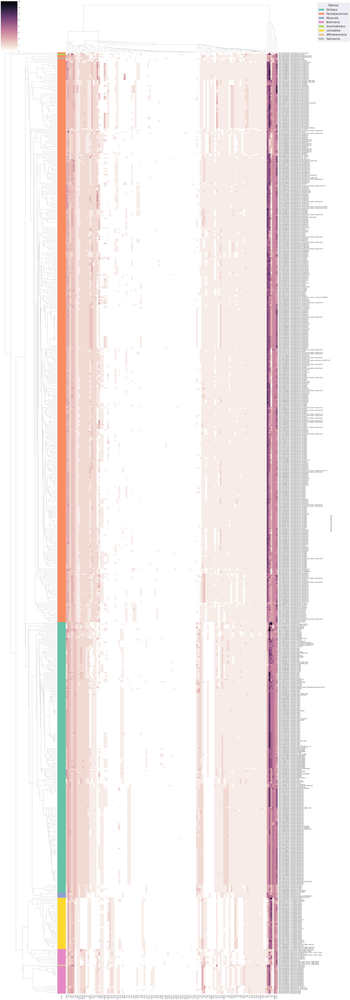

In [39]:
# make a figure that is full size, and all data is legible
large_fam_clustermap = build_family_clustermap(
    fam_freq_df_ggs,
    row_colours=fam_freq_genus_row_colours,
    fig_size=(40,120),
    file_path="../results/pectobact/cazy_families/fam_freq_clustermap.svg",
    file_format='svg',
    lut=fam_g_lut,
    legend_title='Genus',
    dendrogram_ratio=(0.2,0.05),
    title_fontsize=28,
    legend_fontsize=24,
    cbar_pos=(0, 0.95, 0.05, 0.05),
)

/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


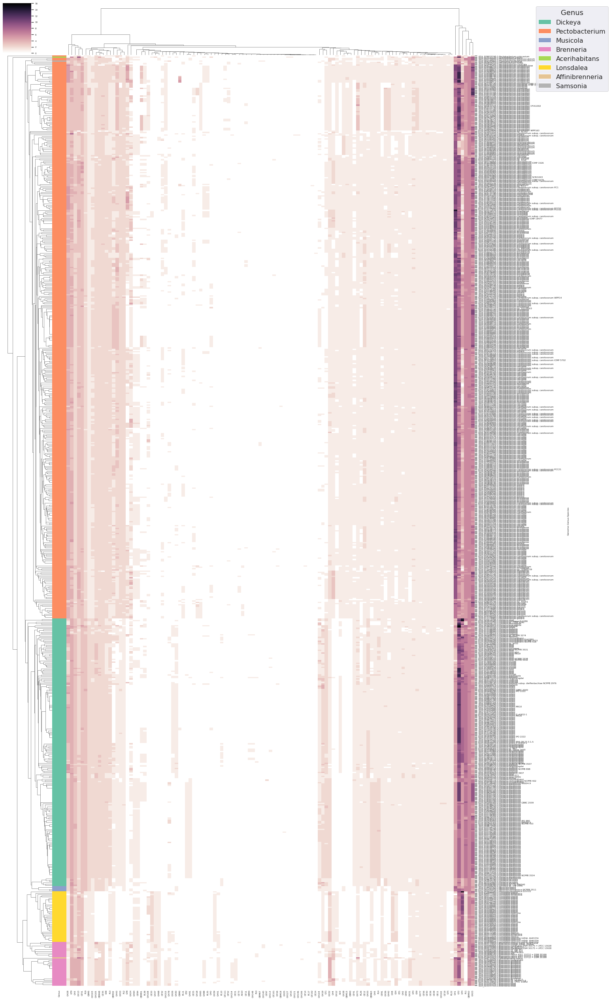

In [40]:
# make a figure the optimal size to fit in a paper
build_family_clustermap(
    fam_freq_df_ggs,
    row_colours=fam_freq_genus_row_colours,
    fig_size=(20,35),
    file_path="../results/pectobact/cazy_families/paper_fam_freq_clustermap.png",
    file_format='png',
    font_scale=0.5,
    lut=fam_g_lut,
    legend_title='Genus',
    dendrogram_ratio=(0.1,0.05),
    title_fontsize=18,
    legend_fontsize=16,
    cbar_pos=(0, 0.95, 0.05, 0.05),
)

### Add species classifications

Looking at the species names in the clustermap, there appears to be clustering of the genomes in a manner that correlates not only with their genus classificaiton but also their species classification. Therefore, add an additional row of row-colours, marking the species classification of each genome.

In [41]:
# define a colour scheme to colour code rows by SPECIES
fam_freq_df_ggs['Species'] = list(fam_freq_df['Species'])  # add column to use for colour scheme, is removed
fam_freq_species_row_colours, fam_s_lut = build_row_colours(fam_freq_df_ggs, 'Species', 'rainbow')

/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


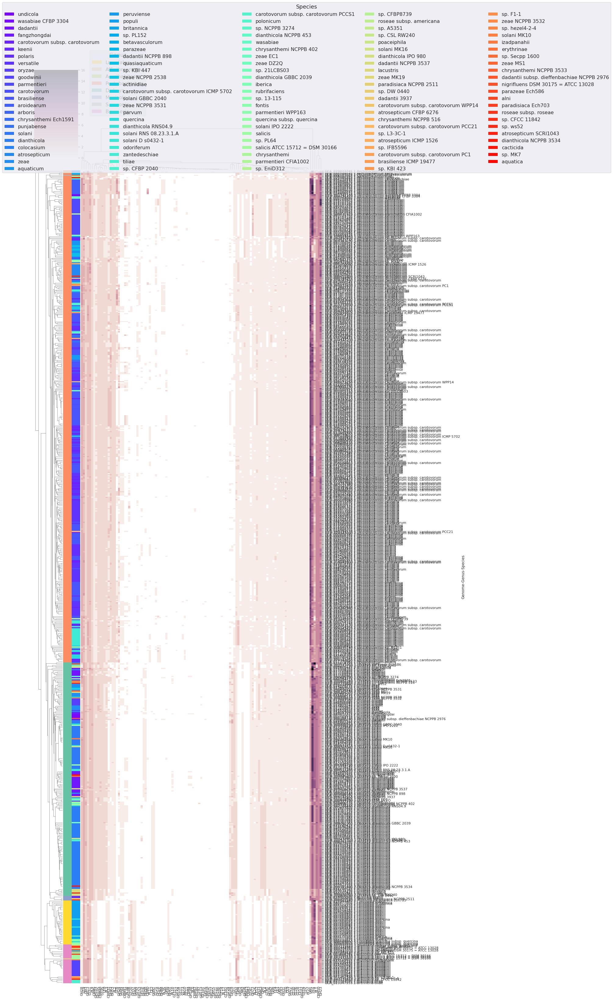

In [42]:
# make a figure the optimal size to fit in a paper
build_family_clustermap_multi_legend(
    df=fam_freq_df_ggs,
    row_colours=[fam_freq_genus_row_colours,fam_freq_species_row_colours],
    luts=[fam_g_lut, fam_s_lut],
    legend_titles=['Genus', 'Species'],
    bbox_to_anchors=[(0.2,1.045), (0.63,1.04)],
    legend_cols=[1,5],
    fig_size=(20,40),
    file_path="../results/pectobact/cazy_families/paper_genus_species_fam_freq_clustermap.png",
    file_format='png',
    font_scale=1,
    dendrogram_ratio=(0.1,0.05),
    title_fontsize=18,
    legend_fontsize=16,
    cbar_pos=(0.01, 0.96, 0.1, 0.1),  #left, bottom, width, height
)

### Add phenotype classification to clustermap

In [43]:
# define a colour scheme to colour code SOFT vs HARD plant tissue targeting genomes
phenotype_col = []
for ri in range(len(fam_freq_df_ggs)):
    if list(fam_freq_df['Genus'])[ri] in ['Pectobacterium', 'Dickeya', 'Musicola']:
        phenotype_col.append('Soft tissue targeting')
    else:
        phenotype_col.append('Hard tissue targeting')
fam_freq_df_ggs['Phenotype'] = phenotype_col
fam_freq_pheno_row_colours, fam_p_lut = build_row_colours(fam_freq_df_ggs, 'Phenotype', "Set1")

/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


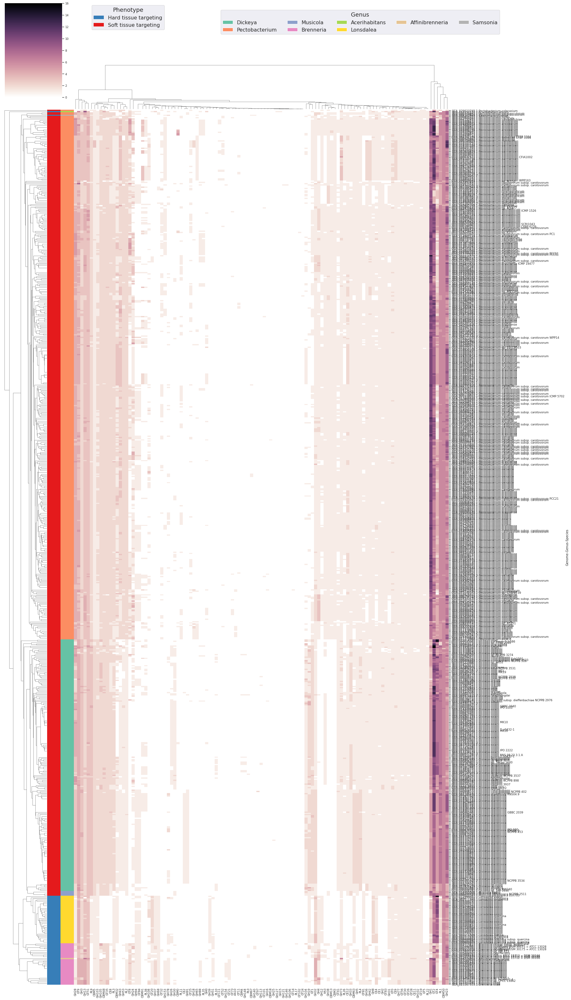

In [44]:
build_family_clustermap_multi_legend(
    df=fam_freq_df_ggs,
    row_colours=[fam_freq_pheno_row_colours, fam_freq_genus_row_colours],
    luts=[fam_p_lut, fam_g_lut],
    legend_titles=['Phenotype', 'Genus'],
    bbox_to_anchors=[(0.225,1.045), (0.63,1.04)],
    legend_cols=[1,5],
    fig_size=(25,41),
    file_path="../results/pectobact/cazy_families/paper_pheno_genus_fam_freq_clustermap.png",
    file_format='png',
    font_scale=0.8,
    dendrogram_ratio=(0.1,0.05),
    title_fontsize=18,
    legend_fontsize=16,
    cbar_pos=(0.01, 0.96, 0.1, 0.1),  #left, bottom, width, height
)

## Remove genomes

In the clustermaps the genomes GCA_029023745.1 (_Pectobacterium colocasium_), GCA_000749925.1 and GCA_000749945.1 (_Pectobacterium betavasulorum_) contained under estimated representations of their respective CAZomes.

Six _Pectobacterium_ genomes were not included within the main _Pectobacterium_ subtree (dendrogram on the RHS of clustermap):
* GCA\_000749925.1 and GCA\_000749845.1 (_Pectobacterium betavasulorum_)
* GCA\_000803215.1 (_Pectobacterium fontis_)
* GCA\_025946765.1 (_Pectobacterium cacticida_)
* GCA\_004137815.1 (_Pectobacterium zantedeschiae_)
* GCA\_029023745.1 (_Pectobacterium colocasium_)

**Extracted from the paper:**
> The genomes appeared to contain fewer total CAZymes (inferred from the lower CAZy family frequencies) than other _Pectobacterium_ genomes, inferring a potential underestimation of their CAZyme features. Genomes GCA_000749925.1, GCA_000749845.1, and GCA_000803215.1 were were listed with the assembly status 'contig' in NCBI (June 2021). Genomic assemblies with the assembly status of 'contig' may contain incomplete genomic sequences. Indeed, the reported CheckM (Parks et al 2015, Genome Res) analysis listed the GCA_000749925.1 and GCA_000749845.1 as missing 5% (100th percentile) of their genomes with 2.25-2.5% contamination, and  GCA_000803215.1 as missing 10% (100th percentile). Furthermore, although listed with the assembly status 'complete genome', assembly GCA_025946765.1 was listed as missing 19% (100th percentile) of its genome by CheckM, and the scaffold GCA_004137815.1 was listed as missing 11% (33rd percentile) with 9% contamination. Therefore, the annotated proteomes potentially underestimates the number of features (including CAZymes) in the genomes, and were excluded from the downstream analyses. The genome GCA_029023745.1 was listed with the assembly status 'complete genome', but the NCBI Prokaryotic Genome Annotation Pipeline (PGAGP) output contained a suspiciously high number of frameshifted proteins (greater than 30%), inferring a potentially poor annotation of the genome that may have resulted in an underestimation of its CAZyme features. Therefore, this genome was also excluded from downstream analyses.

In [45]:
genomes_to_remove = [
    'GCA_000749925.1',
    'GCA_000749845.1',
    'GCA_000803215.1',
    'GCA_025946765.1',
    'GCA_004137815.1',
    'GCA_029023745.1',
]
fam_freq_filtered_df = fam_freq_df[~fam_freq_df['Genome'].isin(genomes_to_remove)]
print(f"Original df length: {len(fam_freq_df)}\nLength after removing genome: {len(fam_freq_filtered_df)}")

Original df length: 717
Length after removing genome: 711


## Replot the clustermap

Replot the clustermap, exlucding the removed genomes.

In [46]:
fam_freq_filtered_df_ggs = fam_freq_filtered_df.set_index(['Genome', 'Genus', 'Species'])

/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


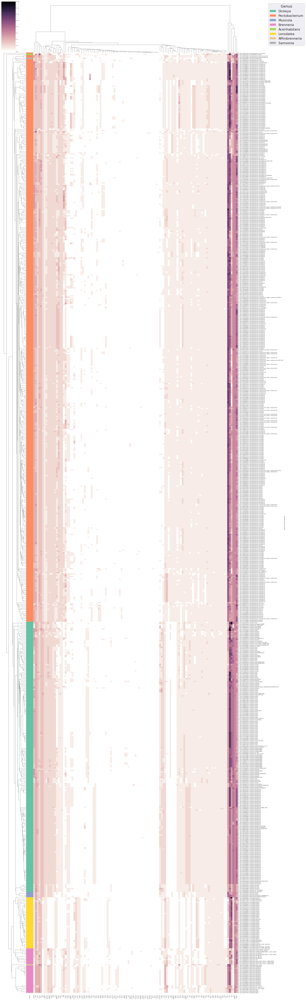

In [47]:
# make a figure the optimal size to fit in a paper
build_family_clustermap(
    fam_freq_df_ggs,
    row_colours=fam_freq_genus_row_colours,
    fig_size=(20,70),
    file_path="../results/pectobact/cazy_families/paper_fam_freq_clustermap_FILTERED.svg",
    file_format='svg',
    font_scale=0.5,
    lut=fam_g_lut,
    legend_title='Genus',
    dendrogram_ratio=(0.1,0.05),
    title_fontsize=18,
    legend_fontsize=16,
    cbar_pos=(0, 0.95, 0.05, 0.05),
)

### Genus specific CAZy families

Identify CAZy families that are only present in one group, e.g. one Genus, using the function `get_group_specific_fams` from `cazomevolve`.

Specifically, `get_group_specific_fams` returns two `dicts`:
1. Group specific families: `{group: {only unique fams}}`
2. All families per group: `{group: {all fams}}`

In [48]:
all_families = list(fam_freq_df.columns)[3:]
# dict {group: {only unique fams}} and dict {group: {all fams}}
unique_grp_fams, group_fams = get_group_specific_fams(fam_freq_filtered_df, 'Genus', all_families)
unique_grp_fams

Identifying Genus specific fams: 100%|██████████| 8/8 [00:00<00:00, 14290.64it/s]


{'Dickeya': {'CBM4', 'CE2', 'GH113', 'GH148', 'GH25', 'GH91', 'GT97', 'PL10'},
 'Pectobacterium': {'AA10',
  'CBM13',
  'GH121',
  'GH146',
  'GH18',
  'GT101',
  'GT102',
  'GT11',
  'GT111',
  'GT14',
  'GT24',
  'GT52',
  'PL11'},
 'Brenneria': {'GH106', 'GT21', 'PL17'},
 'Acerihabitans': {'GH127', 'GH15'}}

Identify families that are only found in hard plant tissue targeting genomes, and those families only found in soft plant tissue targeting species.

In [49]:
hard_soft_fams_dict = {'hard': set(), 'soft': set()}

for ri in tqdm(range(len(fam_freq_filtered_df)), desc="Identifying Soft and Hard plant tissue targeting families"):
    genus = fam_freq_filtered_df.iloc[ri]['Genus']
    
    if genus in ['Pectobacterium','Dickeya','Musicola']:
        grp = 'soft'
    else:
        grp = 'hard'
    
    for fam in fam_freq_filtered_df.columns[3:]:
        if fam_freq_filtered_df.iloc[ri][fam] > 1:
            hard_soft_fams_dict[grp].add(fam)

unique_hard_fams = hard_soft_fams_dict['hard'].difference(hard_soft_fams_dict['soft'])
unique_soft_fams = hard_soft_fams_dict['soft'].difference(hard_soft_fams_dict['hard'])

print("Hard plant tissue targeting specific families:")
for fam in unique_hard_fams:
    print(fam)
print("Soft plant tissue targeting specific families:")
for fam in unique_soft_fams:
    print(fam)

Identifying Soft and Hard plant tissue targeting families:   0%|          | 0/711 [00:00<?, ?it/s]

Hard plant tissue targeting specific families:
GT20
GH77
GT28
GH37
GH31
CE1
CE11
PL22
Soft plant tissue targeting specific families:
GH53
PL9
CBM91
GH5
GH18
CBM63
GT1
GT97
GT30
GT56
GT41
PL26
GT19
PL2
CBM32
CBM0
GT84
GH102
PL4
GH2
CBM13
AA3
GH103
GT32
GH94
GH30
GH38


Build into a df that will be similar to one presented in a paper/report.

In [50]:
# convert into df
unique_grp_data = []

unique_grp_fams['Hard tissue'] = unique_hard_fams
unique_grp_fams['Soft tissue'] = unique_soft_fams

for genus in unique_grp_fams:
    new_data = [genus]
    for cazy_class in ['GH', 'GT', 'CE', 'PL', 'AA', 'CBM']:
        added = False
        class_data = []
        for fam in unique_grp_fams[genus]:
            if fam.startswith(cazy_class):
                class_data.append(fam)
                added = True
        if added is False:
            class_data.append("")
        class_data.sort()
        new_data.append(", ".join(class_data))
            
    unique_grp_data.append(new_data)
    
unique_grp_df = pd.DataFrame(unique_grp_data, columns=['Genus', 'GH', 'GT', 'CE', 'PL', 'AA', 'CBM'])
unique_grp_df.to_csv("../results/pectobact/core_cazome/unique_grp_fams.tsv", sep='\t')
unique_grp_df

,Genus,GH,GT,CE,PL,AA,CBM
0,Dickeya,"GH113, GH148, GH25, GH91",GT97,CE2,PL10,,CBM4
1,Pectobacterium,"GH121, GH146, GH18","GT101, GT102, GT11, GT111, GT14, GT24, GT52",,PL11,AA10,CBM13
2,Brenneria,GH106,GT21,,PL17,,
3,Acerihabitans,"GH127, GH15",,,,,
4,Hard tissue,"GH31, GH37, GH77","GT20, GT28","CE1, CE11",PL22,,
5,Soft tissue,"GH102, GH103, GH18, GH2, GH30, GH38, GH5, GH53...","GT1, GT19, GT30, GT32, GT41, GT56, GT84, GT97",,"PL2, PL26, PL4, PL9",AA3,"CBM0, CBM13, CBM32, CBM63, CBM91"


### Pectobacterium and Dickeya genus-specific families

In order to compare between this GenBank dataset and the RefSeq data set in `explore_pecto_dic_cazomes.ipynb`, drop all genomes not from _Pectobacterium_ and _Dickeya_ from the `fam_freq_df` dataframe, and repeat the analysis to identify genus specific CAZy families.

In [51]:
all_families = list(fam_freq_filtered_df.columns)[3:]
pd_fam_freq_df_filtered = fam_freq_filtered_df[fam_freq_filtered_df['Genus'].isin(
    ['Pectobacterium', 'Dickeya']
)]
# dict {group: {only unique fams}} and dict {group: {all fams}}
pd_unique_grp_fams, pd_group_fams = get_group_specific_fams(pd_fam_freq_df_filtered, 'Genus', all_families)
pd_unique_grp_fams

Identifying Genus specific fams: 100%|██████████| 2/2 [00:00<00:00, 15307.68it/s]


{'Dickeya': {'CBM4',
  'CE2',
  'GH113',
  'GH148',
  'GH25',
  'GH26',
  'GH91',
  'GT97',
  'PL0',
  'PL10'},
 'Pectobacterium': {'AA10',
  'CBM13',
  'CBM18',
  'CBM3',
  'CBM67',
  'GH108',
  'GH12',
  'GH121',
  'GH146',
  'GH153',
  'GH154',
  'GH18',
  'GH38',
  'GH65',
  'GH68',
  'GT101',
  'GT102',
  'GT11',
  'GT111',
  'GT14',
  'GT20',
  'GT24',
  'GT32',
  'GT52',
  'GT73',
  'PL11'}}

<a id="core-cazome"> </a>
## 4. The Core CAZome

Identify CAzy families that are present in every genome in the dataset using `identify_core_cazome()`, which takes the dataframe of CAZy family frequencies (with only CAZy families included in the columns, i.e no taxonomy columns). These families form the 'core CAZome'.

In [52]:
# make output directory
# make output dir for results, will not delete data if dir already exists
make_output_directory(Path('../results/pectobact/core_cazome/'), force=True, nodelete=True)

Output directory ../results/pectobact/core_cazome exists, nodelete is True. Adding output to output directory.


In [53]:
fam_freq_filtered_df_ggs = fam_freq_filtered_df.set_index(['Genome', 'Genus', 'Species'])

In [54]:
core_cazome = identify_core_cazome(fam_freq_filtered_df_ggs)

core_cazome = list(core_cazome)
core_cazome.sort()

print(f"Total families: {len(all_families)}")
print("The core CAZy families are:")
for fam in core_cazome:
    print('-', fam)

Identifying core CAZome: 100%|██████████| 117/117 [00:00<00:00, 8402.25it/s]

Total families: 117
The core CAZy families are:
- CBM5
- CBM50
- GH23
- GH3
- GT2
- GT51
- GT9


The boxplot shows the frequency of each CAZy family across all genomes in the dataframe. We can also break down this data by genus, and build a dataframe of Family, Genus (or tax rank of choice), genome, and frequency.

This dataframe can then be used to build a second dataframe of:
* Family
* Tax rank
* Mean frequency
* SD frequency
Which can be presented as is in a report, or imported into [RawGraphs](https://app.rawgraphs.io/) to build a matrix plot (aka a proporitonal area plot).

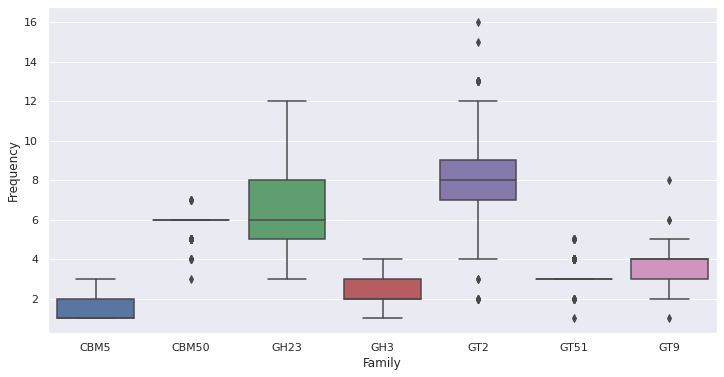

In [55]:
# filter the famil freq df to include only those families in the core CAZome
core_cazome_df = fam_freq_filtered_df_ggs[core_cazome]
plot_fam_boxplot(core_cazome_df, font_scale=0.8, fig_size=(12,6))

The boxplot shows the frequency of each core CAZy family across all _Pectobacteriaceae_. To break down the frequency by genus, build a dataframe with the mean (and SD) of frequency of each family in the core CAZome per genus. This dataframe can then be used to plot a proportional area plot of the mean frequency of each CAZy family per genus, for exampling using [RawGraphs](https://app.rawgraphs.io/).

In [56]:
help(build_fam_mean_freq_df)

Help on function build_fam_mean_freq_df in module cazomevolve.cazome.explore.cazy_families:

build_fam_mean_freq_df(df, grp, round_by=None)
    Build two dataframes of fam frequencies from a wide fam freq df
    
    DF 1: Family, tax rank (i.e. group), genome, freq
    DF 2: Family, tax rank (i.e. group), mean freq, sd freq
    
    :param df: pandas df, each row is a genome and each column a CAZy family
        and one column with tax rank listed (e.g. a 'Genus' column)
        and index includes the genomic accession
    :param grp: str, name of tax rank to group data by, and matches a name of one 
        of the columns in the dataframe (e.g. a 'Genus' column)
    :param round_by: int, number of decimal points to round by. If None, does not round
    
    Return two dataframes



In [57]:
core_cazome_df_genus = copy(core_cazome_df)  # to ensure core_cazome_df is not altereted
core_cazome_df_genus = add_tax_column_from_row_index(core_cazome_df_genus, 'Genus', 1)
core_cazome_df_genus.head()

,,,CBM5,CBM50,GH23,GH3,GT2,GT51,GT9,Genus
Genome,Genus,Species,,,,,,,,
GCA_003725615.1,Dickeya,undicola,2,6,6,3,8,3,4,Dickeya
GCA_000291725.1,Pectobacterium,wasabiae CFBP 3304,1,6,8,3,8,3,3,Pectobacterium
GCA_009903315.1,Dickeya,dadantii,2,6,5,3,10,3,3,Dickeya
GCA_003628775.1,Dickeya,fangzhongdai,2,6,5,3,10,3,4,Dickeya
GCA_000808495.1,Pectobacterium,carotovorum subsp. carotovorum,1,6,6,2,8,3,3,Pectobacterium


In [58]:
core_cazome_fggf_df, core_cazome_mean_freq_df = build_fam_mean_freq_df(
    core_cazome_df_genus,
    'Genus',
    round_by=2,
)

# add rows showing the means across all pectobacteriaceae
all_pecto_core_fam_data = []
for fam in core_cazome_df_genus.columns:
    try:
        mean_freq = np.mean(core_cazome_df_genus[fam]).round(2)
        sd_freq = np.std(core_cazome_df_genus[fam]).round(2)
        all_pecto_core_fam_data.append([fam, 'Pectobacteriaceae', mean_freq, sd_freq])
    except TypeError: # tax column
        continue
    
temp_df = pd.DataFrame(all_pecto_core_fam_data, columns=['Family','Genus','MeanFreq','SdFreq'])
core_cazome_mean_freq_df = pd.concat([core_cazome_mean_freq_df, temp_df])

core_cazome_mean_freq_df.to_csv("../results/pectobact/core_cazome/core_cazome_freqs.csv")

core_cazome_mean_freq_df

Building [Fam, grp, mean freq, sd freq] df: 100%|██████████| 8/8 [00:00<00:00, 121.19it/s]


,Family,Genus,MeanFreq,SdFreq
0,CBM5,Lonsdalea,1.00,0.00
1,CBM50,Lonsdalea,5.79,0.52
2,GH23,Lonsdalea,5.21,1.04
3,GH3,Lonsdalea,1.97,0.28
4,GT2,Lonsdalea,7.03,0.86
...,...,...,...,...
2,GH23,Pectobacteriaceae,6.49,1.55
3,GH3,Pectobacteriaceae,2.49,0.60
4,GT2,Pectobacteriaceae,8.15,2.10
5,GT51,Pectobacteriaceae,3.08,0.37


### Genus specific core CAZomes

As well as look at the core CAZome across all _Pectobacteriaceae_, identify the core CAZome of each genus. Generate a upsetplot to highlight the differences between the core CAZomes.

**Note:** Only looking at those genera that are represented by more than one genome, so that a core CAZome can be found. Otherwise, for genera with only one genome representative, all families in that one genome will be listed in the core CAZome.

In [59]:
genera_of_interest = ['Pectobacterium', 'Dickeya', 'Musicola', 'Brenneria', 'Lonsdalea']
all_families = fam_freq_filtered_df_ggs.columns

core_cazomes = {}  # {genus: {fams}}
for genus in genera_of_interest:
    filtered_df = fam_freq_filtered_df[fam_freq_filtered_df['Genus'] == genus]
    temp_core_cazome = identify_core_cazome(filtered_df[all_families])
    temp_core_cazome = list(temp_core_cazome)
    temp_core_cazome.sort()
    core_cazomes[genus] = {'fams': temp_core_cazome, 'freqs': {len(filtered_df)}}
    
core_cazomes

Identifying core CAZome: 100%|██████████| 117/117 [00:00<00:00, 16553.11it/s]


{'Pectobacterium': {'fams': ['CBM5',
   'CBM50',
   'GH1',
   'GH103',
   'GH23',
   'GH28',
   'GH3',
   'GH43',
   'GT2',
   'GT51',
   'GT9',
   'PL1',
   'PL2',
   'PL22',
   'PL3',
   'PL9'],
  'freqs': {426}},
 'Dickeya': {'fams': ['CBM48',
   'CBM5',
   'CBM50',
   'CE4',
   'CE8',
   'GH1',
   'GH103',
   'GH105',
   'GH13',
   'GH23',
   'GH28',
   'GH3',
   'GH33',
   'GH73',
   'GH77',
   'GH8',
   'GT1',
   'GT19',
   'GT2',
   'GT28',
   'GT35',
   'GT4',
   'GT5',
   'GT51',
   'GT9',
   'PL1',
   'PL9'],
  'freqs': {206}},
 'Musicola': {'fams': ['CBM48',
   'CBM5',
   'CBM50',
   'CE1',
   'CE11',
   'CE12',
   'CE4',
   'CE8',
   'CE9',
   'GH1',
   'GH102',
   'GH103',
   'GH104',
   'GH105',
   'GH13',
   'GH19',
   'GH2',
   'GH23',
   'GH28',
   'GH3',
   'GH30',
   'GH31',
   'GH32',
   'GH33',
   'GH38',
   'GH5',
   'GH73',
   'GH77',
   'GH8',
   'GT0',
   'GT1',
   'GT19',
   'GT2',
   'GT26',
   'GT28',
   'GT30',
   'GT35',
   'GT4',
   'GT5',
   'GT51',
   '

In [60]:
core_cazome_upsetplot_membership = []
core_cazome_upsetplot_membership = add_to_upsetplot_membership(
    core_cazome_upsetplot_membership,
    core_cazomes,
)
len(core_cazome_upsetplot_membership)

708

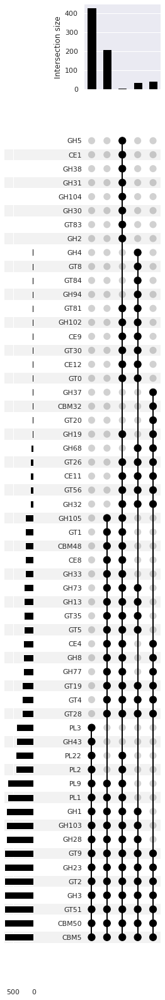

In [61]:
core_cazome_upsetplot = build_upsetplot(
    core_cazome_upsetplot_membership,
    sort_by='input',
    file_path='../results/pectobact/core_cazome/genera_core_cazome.svg',
)

Identify the core CAZome of soft and hard plant tissue targeting genera:

In [62]:
soft_genera = ['Pectobacterium', 'Dickeya', 'Musicola']
hard_genera = ['Brenneria', 'Lonsdalea', 'Samsonia', 'Affinibrenneria', 'Acerihabitans']
grps = [[soft_genera, 'Soft tissue targeting'], [hard_genera, 'Hard tissue targeting']]

all_families = fam_freq_filtered_df_ggs.columns

soft_hard_core_cazomes = {}  # {grp: {fams}}
for grp in tqdm(grps):
    # gather all rows containing the genera of interest
    filtered_df = fam_freq_filtered_df[fam_freq_filtered_df['Genus'].isin(grp[0])]
    temp_core_cazome = identify_core_cazome(filtered_df[all_families])
    temp_core_cazome = list(temp_core_cazome)
    temp_core_cazome.sort()
    try:
        soft_hard_core_cazomes[grp[1]]
    except KeyError:
        soft_hard_core_cazomes[grp[1]] = {'fams': set(), 'freqs': [0]}

    soft_hard_core_cazomes[grp[1]]['fams'] = soft_hard_core_cazomes[grp[1]]['fams'].union(
        set(temp_core_cazome)
    )
    soft_hard_core_cazomes[grp[1]]['freqs'][0] += len(filtered_df)
    
soft_hard_core_cazomes

  0%|          | 0/2 [00:00<?, ?it/s]


Identifying core CAZome: 100%|██████████| 117/117 [00:00<00:00, 8694.78it/s]

Identifying core CAZome: 100%|██████████| 117/117 [00:00<00:00, 16819.19it/s]


{'Soft tissue targeting': {'fams': {'CBM5',
   'CBM50',
   'GH1',
   'GH103',
   'GH23',
   'GH28',
   'GH3',
   'GT2',
   'GT51',
   'GT9',
   'PL1',
   'PL9'},
  'freqs': [636]},
 'Hard tissue targeting': {'fams': {'CBM5',
   'CBM50',
   'CE11',
   'GH23',
   'GH3',
   'GT19',
   'GT2',
   'GT26',
   'GT28',
   'GT4',
   'GT51',
   'GT56',
   'GT9'},
  'freqs': [75]}}

In [63]:
soft_hard_core_cazomes.update(core_cazomes)

In [64]:
core_cazome_upsetplot_membership = []
core_cazome_upsetplot_membership = add_to_upsetplot_membership(
    core_cazome_upsetplot_membership,
    soft_hard_core_cazomes,
)
len(core_cazome_upsetplot_membership)

1419

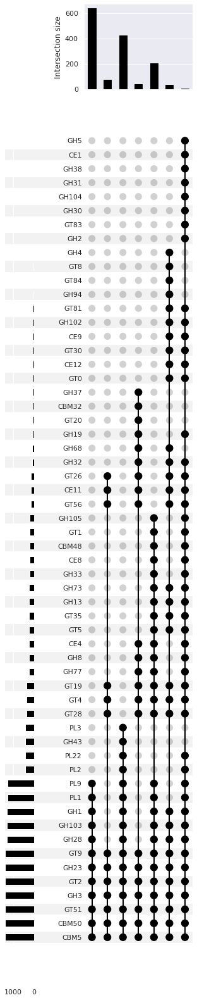

In [65]:
core_cazome_upsetplot = build_upsetplot(
    core_cazome_upsetplot_membership,
    file_path='../results/pectobact/core_cazome/genera_soft_hard_core_cazome.svg',
)

<a id="co-occurring"> </a>
## 5. Families that always occur together

Identify CAZy families that are always present in the genome together - this approach does not tolerate one CAZy family ever appearing without the other family in the same genome.

In [66]:
# make output dir for results, will not delete data if dir already exists
make_output_directory(Path('../results/pectobact/cooccurring_families/'), force=True, nodelete=True)

# reminder of the structure of the df
fam_freq_filtered_df.head(1)

Output directory ../results/pectobact/cooccurring_families exists, nodelete is True. Adding output to output directory.


,Genome,Genus,Species,AA10,AA3,CBM0,CBM13,CBM18,CBM3,CBM32,...,PL11,PL17,PL2,PL22,PL26,PL3,PL35,PL38,PL4,PL9
0,GCA_003725615.1,Dickeya,undicola,0,1,0,0,0,0,0,...,0,0,1,1,0,1,0,0,1,3


**Using a correlation matrix:**

CAZy families that always appear together can be identified by generating a correlation matrix using the Python package `pandas`, CAZy families that are always present together will have a correlation matrix of 1. 

This can be done using the `identify_cooccurring_fams_corrM()` function. CAZy families that are always present in the genome (i.e. the core CAZome), or are absent from all genomes will be calulcated to have a correlation score of `nan`. In order to plot the correlation matrix, the `fill_value` key word for `identify_cooccurring_fams_corrM()` can be used to replace all `nan` values with an interger.

`identify_cooccurring_fams_corrM()` returns a correlation matrix and ...

In [67]:
all_families = list(fam_freq_filtered_df.columns[3:])

cooccurring_families, fam_corr_M_filled = identify_cooccurring_fams_corrM(
    fam_freq_filtered_df,
    all_families,
    core_cazome=[],
    corrM_path="../results/pectobact/cooccurring_families/fam_corr_M_filled.csv",
    fill_value=2,
)

Identifying always co-occurring families: 100%|██████████| 117/117 [00:00<00:00, 2035.33it/s]


In [68]:
cooccurring_families

{('CBM4', 'GH148'), ('GH121', 'GH146'), ('GH127', 'GH15'), ('GH94', 'GT84')}

Generate a clustermap of the correlation matrix.

/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/emmah/.conda/envs/pectobacteriaceae/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


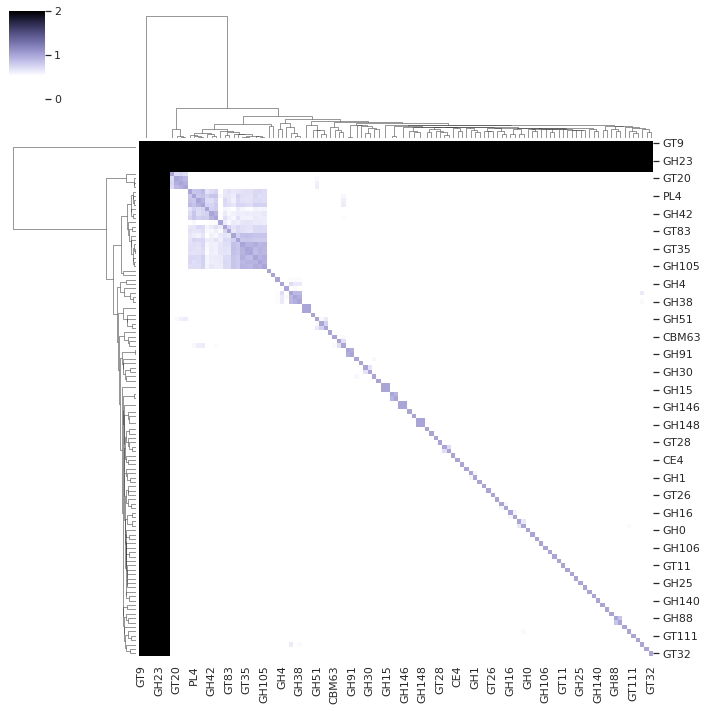

In [69]:
sns.clustermap(
    fam_corr_M_filled,
    cmap=sns.cubehelix_palette(rot=0, dark=2, light=0, reverse=True, as_cmap=True),
)

**An iterative approach to identify co-occurring families:**

Iterate through the dataframe of CAZy family frequencies in _Pectobacteriaceae_ (`fam_freq_df_filtered`) and identify the groups of always co-occurring CAZy families (i.e. those families that are always present together) and count the number of genomes in which the families are present together.

This is done using the `cazomevolve` function `calc_cooccuring_fam_freqs`, which returns a dictionary of groups of co-occurring CAZy families. The function takes as input:
1. The dataframe of CAZy family frequencies (it can include taxonomy information in columns)
2. A list of the CAZy families to analyse
3. (Optional) whether to include or exclude the core CAZome from the list of always co-occurring CAZy families.

In [70]:
cooccurring_fams_dict = calc_cooccuring_fam_freqs(
    fam_freq_filtered_df,
    list(all_families),
    exclude_core_cazome=False,
)
cooccurring_fams_dict

Combining pairs of co-occurring families: 100%|██████████| 25/25 [00:00<00:00, 194541.00it/s]


{0: {'fams': {'CBM4', 'GH148'}, 'freqs': {8}},
 1: {'fams': {'CBM5', 'CBM50', 'GH23', 'GH3', 'GT2', 'GT51', 'GT9'},
  'freqs': {711}},
 2: {'fams': {'GH121', 'GH146'}, 'freqs': {1}},
 3: {'fams': {'GH127', 'GH15'}, 'freqs': {1}},
 4: {'fams': {'GH94', 'GT84'}, 'freqs': {309}}}

For each _Pectobacteriaceae_ genus, identify the groups of always co-occurring CAZy families.

**Note:** Limit the analysis to only those genera represented by more than one genome. Looking at genera where only one genome was analysed, all families in the genome will be listed as always co-occurring.

In [71]:
genera_cooccuring_fams = {}  # {genus: cooccurring_fams_dict}

for genus in tqdm(
    ['Pectobacterium', 'Dickeya', 'Musicola', 'Lonsdalea', 'Brenneria'],
    desc="Identifying genus specific co-occurring fams",
):
    genus_fam_freq_df = fam_freq_filtered_df[fam_freq_filtered_df['Genus'] == genus]
    genus_cooccurring_fams_dict = calc_cooccuring_fam_freqs(
        genus_fam_freq_df,
        list(all_families),
        exclude_core_cazome=False,
    )
    genera_cooccuring_fams[genus] = genus_cooccurring_fams_dict
genera_cooccuring_fams

Identifying genus specific co-occurring fams:   0%|          | 0/5 [00:00<?, ?it/s]


Identifying pairs of co-occurring families: 100%|██████████| 117/117 [00:01<00:00, 116.44it/s]

Combining pairs of co-occurring families: 100%|██████████| 135/135 [00:00<00:00, 284109.90it/s]

Identifying pairs of co-occurring families: 100%|██████████| 117/117 [00:00<00:00, 227.31it/s]

Combining pairs of co-occurring families: 100%|██████████| 361/361 [00:00<00:00, 233520.01it/s]

Identifying pairs of co-occurring families: 100%|██████████| 117/117 [00:00<00:00, 1125.16it/s]

Combining pairs of co-occurring families: 100%|██████████| 1130/1130 [00:00<00:00, 718006.90it/s]

Identifying pairs of co-occurring families: 100%|██████████| 117/117 [00:00<00:00, 955.40it/s][A

Combining pairs of co-occurring families: 100%|██████████| 255/255 [00:00<00:00, 486821.81it/s]

Identifying pairs of co-occurring families: 100%|██████████| 117/117 [00:00<00:00, 611.29it/s][A

Combining pairs of co-occurring families: 100%|██████████| 500/500 [00:00<00:00, 535671.01it/s]


{'Pectobacterium': {0: {'fams': {'CBM3', 'GH5'}, 'freqs': {425}},
  1: {'fams': {'CBM48', 'CE8', 'CE9', 'GH13'}, 'freqs': {425}},
  2: {'fams': {'CBM5',
    'CBM50',
    'GH1',
    'GH103',
    'GH23',
    'GH28',
    'GH3',
    'GH43',
    'GT2',
    'GT51',
    'GT9',
    'PL1',
    'PL2',
    'PL22',
    'PL3',
    'PL9'},
   'freqs': {426}},
  3: {'fams': {'CE11', 'GH102', 'GH32'}, 'freqs': {425}},
  4: {'fams': {'GH105', 'GT56'}, 'freqs': {425}},
  5: {'fams': {'GH121', 'GH146', 'GH154'}, 'freqs': {1}},
  6: {'fams': {'GH94', 'GT84'}, 'freqs': {152}}},
 'Dickeya': {0: {'fams': {'CBM4', 'GH148'}, 'freqs': {8}},
  1: {'fams': {'CBM48',
    'CBM5',
    'CBM50',
    'CE4',
    'CE8',
    'GH1',
    'GH103',
    'GH105',
    'GH13',
    'GH23',
    'GH28',
    'GH3',
    'GH33',
    'GH73',
    'GH77',
    'GH8',
    'GT1',
    'GT19',
    'GT2',
    'GT28',
    'GT35',
    'GT4',
    'GT5',
    'GT51',
    'GT9',
    'PL1',
    'PL9'},
   'freqs': {206}},
  2: {'fams': {'CE11', 'GT83'

Identify families that always co-occurring in soft and hard plant tissue genera.

In [72]:
soft_genera = ['Pectobacterium', 'Dickeya', 'Musicola']
hard_genera = ['Brenneria', 'Lonsdalea', 'Samsonia', 'Affinibrenneria', 'Acerihabitans']
# hard_genera = ['Brenneria', 'Lonsdalea']
grps = [[soft_genera, 'Soft tissue targeting'], [hard_genera, 'Hard tissue targeting']]

for grp in tqdm(grps):
    # gather all rows containing the genera of interest
    grp_fam_freq_df = fam_freq_filtered_df[fam_freq_filtered_df['Genus'].isin(grp[0])]
    
    grp_cooccurring_fams_dict = calc_cooccuring_fam_freqs(
        grp_fam_freq_df,
        list(all_families),
        exclude_core_cazome=False,
    )
    genera_cooccuring_fams[grp[1]] = grp_cooccurring_fams_dict

  0%|          | 0/2 [00:00<?, ?it/s]


Identifying pairs of co-occurring families: 100%|██████████| 117/117 [00:01<00:00, 77.94it/s]

Combining pairs of co-occurring families: 100%|██████████| 75/75 [00:00<00:00, 369216.90it/s]

Identifying pairs of co-occurring families: 100%|██████████| 117/117 [00:00<00:00, 423.04it/s][A

Combining pairs of co-occurring families: 100%|██████████| 91/91 [00:00<00:00, 387494.08it/s]


### Build an upset plot of co-occurring CAZy families

Build an upsetplot (using the Python package `upsetplot`) to visulise the groups of always co-occurring CAZy families, additionally it will plot the number of genomes in which each group of co-occurring CAZy families were present.

First compile the data/membership for the upset plot by:
1. Creating an empty list to store the upset plot data
2. Adding to the empty list the data contained in each dictionary of co-occurring CAZy families by using the `add_to_upsetplot_membership()` function

In [73]:
upsetplot_membership = []
upsetplot_membership = add_to_upsetplot_membership(upsetplot_membership, cooccurring_fams_dict)

for genus in genera_cooccuring_fams:
    upsetplot_membership = add_to_upsetplot_membership(
        upsetplot_membership,
        genera_cooccuring_fams[genus],
    )

len(upsetplot_membership)

7233

Build the upset plot. This will include the core CAZomes across _Pectobacteriaceae_, per genus, and per all soft plant tissue targeting genera and all hard plant tissue targeting genera.

In [74]:
help(build_upsetplot)

Help on function build_upsetplot in module cazomevolve.cazome.explore.cooccurring_families:

build_upsetplot(upsetplot_membership, file_path=None, file_format='svg', sort_by='degree', sort_categories_by='cardinality')
    Use the upsetplot package to build an upsetplot of co-occurring families
    
    :param upsetplot_membership: list of lists, one nested list per instance of co-occurring families group
    :param file_path, str/Path, path to write out figure. If none, file is not written out
    :param file_format: str, format to write out file, e.g. svg or png, default, svg
    :param sort_by: str, method to sort subsets 
        From Upsetplot:
            sort_by : {'cardinality', 'degree', '-cardinality', '-degree',
                    'input', '-input'}
                If 'cardinality', subset are listed from largest to smallest.
                If 'degree', they are listed in order of the number of categories
                intersected. If 'input', the order they appear in the

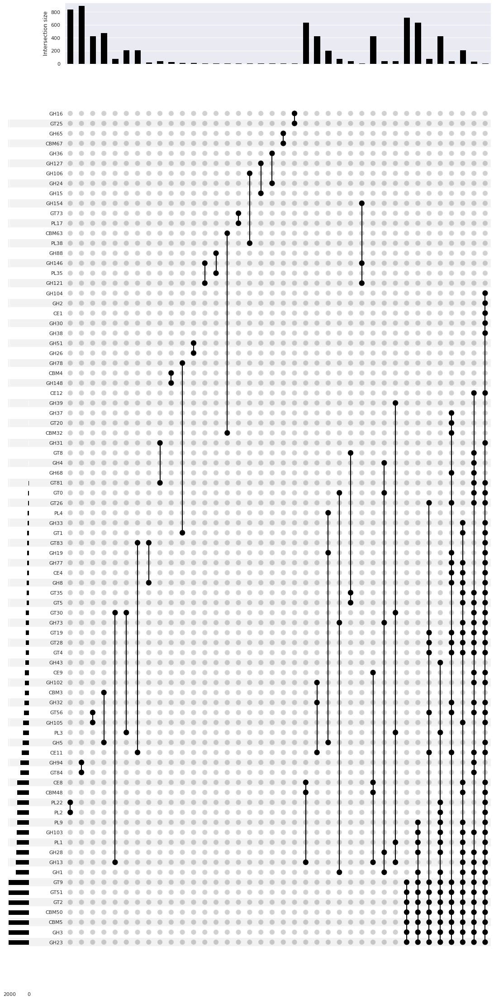

In [75]:
pectobact_upsetplot = build_upsetplot(
    upsetplot_membership,
    file_path='../results/pectobact/cooccurring_families/pecto-cooccurring-families.svg',
)

**Break down the incidences per genus:**

The upset plot generates a bar chart showing the number of genomes that each group of co-occuring CAZy families appeared in. However, this plots the total number across each of the groups (i.e. _Pectobacterium_, _Dickeya_, etc.).

To break down the indidence (i.e. the number of genomes that each group of co-occurring CAZy families were present in) per group, a dataframe listing each group of co-occurring CAZy families, the group (i.e. genus), and the respective frequency must be generated. This dataframe can then be used to generate a proportional area plot (or matrix plot), breaking down the incidence per group (i.e. genus).

The groups of co-occurring CAZy families must be listed in the same order as they are presented in the upset plot.

In [76]:
upset_plot_groups = get_upsetplot_grps(upsetplot_membership)

100%|██████████| 38/38 [00:01<00:00, 20.85it/s]


Compiling the data of the incidence of each grp of co-occurring CAZy families per group of interest (e.g. per genus), into a single dataframe.

Create an empty list to store all data for the dataframe, then use `add_upsetplot_grp_freqs` to add data of the incidence per group of co-occurring CAZy families to the list. `build_upsetplot_matrix` is then used to build the dataframe.

In [77]:
help(add_upsetplot_grp_freqs)

Help on function add_upsetplot_grp_freqs in module cazomevolve.cazome.explore.cooccurring_families:

add_upsetplot_grp_freqs(upset_plt_groups, cooccurring_grp_freq_data, cooccurring_fam_dict, grp, grp_sep=False, grp_order=None, include_none=False)
    Add data on the incidence of co-occurring grps of CAZy families from the
    cooccurring_fam_dict to cooccurring_grp_freq_data
    
    :param upset_plt_groups: list of lists, one nested list per grp of co-occurring CAZy families
        grps listed in same order as present in the upsetplot
    :param cooccurring_grp_freq_data: list of lists, one nested list per 
        pair of 'grp' and grp of co-occurring CAZy families
    :param cooccurring_fam_dict: dict, {grp_num: {'fams': {families}, 'freqs': {freqs/incidences}}}
    :param grp: str, name of grp to be added to cooccurring_grp_freq_data, e.g. the name of the genus
    :param grp_sep: bool, does the cooccurring_fam_dict contain data separated into grps, e.g. by genus
        {grp(e.g

In [78]:
cooccurring_grp_freq_data = []  # empty list to store data for the df

# add pectobacteriaceae data
genera_cooccuring_fams['Pectobacteriaceae'] = cooccurring_fams_dict

# add data for each genus, all soft plant targeting and hard plant tissue targeting
cooccurring_grp_freq_data = add_upsetplot_grp_freqs(
    upset_plot_groups,
    cooccurring_grp_freq_data,
    genera_cooccuring_fams,
    genus,
    grp_sep=True,
    grp_order=[
        'Pectobacteriaceae', 
        'Pectobacterium', 'Dickeya', 'Musicola', 'Soft tissue targeting',
        'Brenneria', 'Lonsdalea', 'Hard tissue targeting',
    ],
    include_none=True,
)

Compiling co-occurring families incidence data: 100%|██████████| 38/38 [00:00<00:00, 19460.75it/s]


Build a single dataframe of co-occurring families, freq and group (e.g. genus).

But also list the information for each group in the same order the groups of CAZy families are listed in the upset plot. This allows a proportional area plot to be generated (for example, by using [RawGraphs](https://app.rawgraphs.io/)), which can then be combined with the upset plot (for example, using [inkscape](https://inkscape.org/)).

In [79]:
help(build_upsetplot_matrix)

Help on function build_upsetplot_matrix in module cazomevolve.cazome.explore.cooccurring_families:

build_upsetplot_matrix(cooccurring_grp_freq_data, grp, file_path=None)
    Build matrix of grp of CAZy families, grp of interest name (e.g. genus) and incidence 
    (i.e. the number of genomes that the grp of CAZy families appeared in)
    
    :param cooccurring_grp_freq_data: list of lists, one nested list per row in the df
    :param grp: str, name of grouping, i.e. the method used to group the genomes,
        .e.g. 'Genus', or 'Species'
    :param file_path: str/Path, path to write out CSV file. If none, the file is not 
        written to file
        
    Return df



In [80]:
# build the dataframe
cooccurring_fams_freq_df = build_upsetplot_matrix(
    cooccurring_grp_freq_data,
    'Genus',
    file_path='../results/pectobact/cooccurring_families/cooccurring_fams_freqs.csv',
)
cooccurring_fams_freq_df

,Families,Genus,Incidence
0,PL2+PL22,Pectobacteriaceae,NaN
1,PL2+PL22,Pectobacterium,NaN
2,PL2+PL22,Dickeya,205.0
3,PL2+PL22,Musicola,NaN
4,PL2+PL22,Soft tissue targeting,635.0
...,...,...,...
299,GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+GH1+GH13+GH28...,Musicola,4.0
300,GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+GH1+GH13+GH28...,Soft tissue targeting,NaN
301,GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+GH1+GH13+GH28...,Brenneria,NaN
302,GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+GH1+GH13+GH28...,Lonsdalea,NaN


### Generate figure for paper

After analysing the data, mannually group of the soft and hard tissue targeting specific groups of CAZy families together and mannually define the order the groups are presented in the final upset plot (by setting the param `sort_by` to `'input'`).

In [81]:
set(pd.read_csv('../results/pectobact/cooccurring_families/cooccurring_fams_freqs.csv')['Families'])

{'CBM32+CBM63',
 'CBM67+GH65',
 'CE11+GH32+GH102',
 'CE11+GT83',
 'GH1+GH28+GH73+GT0+GH4',
 'GH1+GH73+GT0',
 'GH105+GT56',
 'GH121+GH146',
 'GH121+GH146+GH154',
 'GH13+CBM48+CE8',
 'GH13+CBM48+CE8+CE9',
 'GH13+GT30',
 'GH13+PL1+PL3+GT30+GH39',
 'GH148+CBM4',
 'GH15+GH127',
 'GH23+GH3+CBM5+CBM50+GT2+GT51+GT9',
 'GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+CE11+GT56+GH32+GT4+GT28+GT19+GH8+CE4+GH77+GH19+GT26+GH68+CBM32+GT20+GH37',
 'GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+CE11+GT56+GT4+GT28+GT19+GT26',
 'GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+GH1+GH13+GH28+GH103+GT84+GH94+CE11+GT56+GH32+GH102+CE9+GT4+GT28+GT19+GH73+GT30+GT5+GT35+GT26+GT0+GT81+GH68+GH4+GT8+CE12',
 'GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+GH1+GH13+GH28+PL1+GH103+PL9+CBM48+CE8+GH105+GT4+GT28+GT19+GH73+GT5+GT35+GH8+CE4+GH77+GT1+GH33',
 'GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+GH1+GH13+GH28+PL1+GH103+PL9+PL2+PL22+CBM48+CE8+CE11+GH5+GH105+GT56+GH32+GH102+CE9+GT4+GT28+GT19+GH73+GT30+GT5+GT35+GH8+CE4+GH77+GH19+GT83+GT1+GH33+GT26+GT0+GT81+GH31+CE12+GH38+GH30+CE1+GH2+G

In [82]:
grp_order = {
    'soft_grps': [  # grps only found in soft plant tissue targeting genomes
        'GH13+CBM48+CE8', # S
        'PL2+PL22', # # S D
        'GH148+CBM4', # S D
        'PL3+GT30', # D
        'PL35+GH88', # D
        'CE11+GT83', # D
        'GT25+GH16', # D
        'GH5+GH19+PL4', # D
        'GH121+GH146+GH154', # S P   
        'GH121+GH146',
        'GH105+GT56', # P
        'GH13+CBM48+CE8+CE9',  # P
        'CE11+GH32+GH102', # P
        
    ],
    'musicola': [  # grps found only in musicola
        'CBM32+CBM63',
        'GH24+GH36',
    ],
    'both_grps': [  # grps found in soft and hard plant tissue targeting genomes
        'GT84+GH94', # 
        'GH5+CBM3', #
    ],
    'hard_musicola_grps': [  # grps only found in hard plant tissue targeting genomes and Musicola
        'GH13+GT30',
        'GH1+GH73+GT0',
        'GT5+GT35+GT8',
        'GH15+GH127',
        'GT81+GH31', # L
        'GH8+GT83', # B
    ],
    'hard_grps': [ # grps only found in hard plant tissue targeting genomes
        'CBM67+GH65', # H
        'PL17+GT73', # L B
        'PL38+GH106', # L B
        'GT1+GH78', # L
        'GH26+GH51', # L
        'GH1+GH28+GH73+GT0+GH4',
        'GH13+PL1+PL3+GT30+GH39',
    ],
    'all_core_cazomes': [ # then core cazomes at the end
        'GH23+GH3+CBM5+CBM50+GT2+GT51+GT9',  # pectobacteriaceae
        'GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+GH1+GH28+PL1+GH103+PL9',  # soft plant tissue targeting
        'GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+GH1+GH13+GH28+PL1+GH103+PL9+CBM48+CE8+GH105+GT4+GT28+GT19+GH73+GT5+GT35+GH8+CE4+GH77+GT1+GH33',   # dickeya
        'GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+GH1+GH28+PL1+GH103+PL9+PL2+PL22+PL3+GH43', # pectobacter 
        'GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+GH1+GH13+GH28+PL1+GH103+PL9+PL2+PL22+CBM48+CE8+CE11+GH5+GH105+GT56+GH32+GH102+CE9+GT4+GT28+GT19+GH73+GT30+GT5+GT35+GH8+CE4+GH77+GH19+GT83+GT1+GH33+GT26+GT0+GT81+GH31+CE12+GH38+GH30+CE1+GH2+GH104',  # musicola
        'GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+CE11+GT56+GT4+GT28+GT19+GT26',  # hard
        'GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+CE11+GT56+GH32+GT4+GT28+GT19+GH8+CE4+GH77+GH19+GT26+GH68+CBM32+GT20+GH37',   # lonsdalea
        'GH23+GH3+CBM5+CBM50+GT2+GT51+GT9+GH1+GH13+GH28+GH103+GT84+GH94+CE11+GT56+GH32+GH102+CE9+GT4+GT28+GT19+GH73+GT30+GT5+GT35+GT26+GT0+GT81+GH68+GH4+GT8+CE12', # bren
    ],
}
for grp in grp_order:
    grps = []
    for fams_str in grp_order[grp]:
        fams_list = fams_str.split("+")
        fams_list.sort()
        fams = "+".join(fams_list)
        grps.append(fams)
    grp_order[grp] = grps
grp_order

{'soft_grps': ['CBM48+CE8+GH13',
  'PL2+PL22',
  'CBM4+GH148',
  'GT30+PL3',
  'GH88+PL35',
  'CE11+GT83',
  'GH16+GT25',
  'GH19+GH5+PL4',
  'GH121+GH146+GH154',
  'GH121+GH146',
  'GH105+GT56',
  'CBM48+CE8+CE9+GH13',
  'CE11+GH102+GH32'],
 'musicola': ['CBM32+CBM63', 'GH24+GH36'],
 'both_grps': ['GH94+GT84', 'CBM3+GH5'],
 'hard_musicola_grps': ['GH13+GT30',
  'GH1+GH73+GT0',
  'GT35+GT5+GT8',
  'GH127+GH15',
  'GH31+GT81',
  'GH8+GT83'],
 'hard_grps': ['CBM67+GH65',
  'GT73+PL17',
  'GH106+PL38',
  'GH78+GT1',
  'GH26+GH51',
  'GH1+GH28+GH4+GH73+GT0',
  'GH13+GH39+GT30+PL1+PL3'],
 'all_core_cazomes': ['CBM5+CBM50+GH23+GH3+GT2+GT51+GT9',
  'CBM5+CBM50+GH1+GH103+GH23+GH28+GH3+GT2+GT51+GT9+PL1+PL9',
  'CBM48+CBM5+CBM50+CE4+CE8+GH1+GH103+GH105+GH13+GH23+GH28+GH3+GH33+GH73+GH77+GH8+GT1+GT19+GT2+GT28+GT35+GT4+GT5+GT51+GT9+PL1+PL9',
  'CBM5+CBM50+GH1+GH103+GH23+GH28+GH3+GH43+GT2+GT51+GT9+PL1+PL2+PL22+PL3+PL9',
  'CBM48+CBM5+CBM50+CE1+CE11+CE12+CE4+CE8+CE9+GH1+GH102+GH103+GH104+GH105+GH13+G

In [83]:
paper_cooccurring_fams = {}  # {grp_num: {'fams': {fams}, 'freqs': {int}}}
num_of_grp = 0

for pheno_grp in grp_order:
    for fam_grp in grp_order[pheno_grp]:
        fams = fam_grp.split("+")
        fams.sort()
        
        for genus in ['Pectobacterium', 'Dickeya', 'Musicola', 'Soft tissue targeting', 'Hard tissue targeting', 'Brenneria', 'Lonsdalea']:
            # {grp num: {'fams': {fams}, 'freqs': {int}}}
            
            for grp_num in genera_cooccuring_fams[genus]:
                grp_fams = list(genera_cooccuring_fams[genus][grp_num]['fams'])
                grp_fams.sort()
                
                if grp_fams == fams:
                    
                    this_grp_num = None
                    
                    for co_grp_num in paper_cooccurring_fams:
                        if paper_cooccurring_fams[co_grp_num]['fams'] == genera_cooccuring_fams[genus][grp_num]['fams']:
                            this_grp_num = co_grp_num
                            
                    if this_grp_num is None:
                        this_grp_num = copy(num_of_grp)
                    
                        paper_cooccurring_fams[this_grp_num] = {
                            'fams': genera_cooccuring_fams[genus][grp_num]['fams'],
                            'freqs': genera_cooccuring_fams[genus][grp_num]['freqs']
                        }
                        
                        num_of_grp += 1
                    
paper_cooccurring_fams

{0: {'fams': {'CBM48', 'CE8', 'GH13'}, 'freqs': {635}},
 1: {'fams': {'PL2', 'PL22'}, 'freqs': {205}},
 2: {'fams': {'CBM4', 'GH148'}, 'freqs': {8}},
 3: {'fams': {'GT30', 'PL3'}, 'freqs': {205}},
 4: {'fams': {'GH88', 'PL35'}, 'freqs': {3}},
 5: {'fams': {'CE11', 'GT83'}, 'freqs': {204}},
 6: {'fams': {'GH16', 'GT25'}, 'freqs': {1}},
 7: {'fams': {'GH19', 'GH5', 'PL4'}, 'freqs': {203}},
 8: {'fams': {'GH121', 'GH146', 'GH154'}, 'freqs': {1}},
 9: {'fams': {'GH105', 'GT56'}, 'freqs': {425}},
 10: {'fams': {'CBM48', 'CE8', 'CE9', 'GH13'}, 'freqs': {425}},
 11: {'fams': {'CE11', 'GH102', 'GH32'}, 'freqs': {425}},
 12: {'fams': {'CBM32', 'CBM63'}, 'freqs': {2}},
 13: {'fams': {'GH24', 'GH36'}, 'freqs': {2}},
 14: {'fams': {'GH94', 'GT84'}, 'freqs': {152}},
 15: {'fams': {'CBM3', 'GH5'}, 'freqs': {425}},
 16: {'fams': {'GH13', 'GT30'}, 'freqs': {74}},
 17: {'fams': {'GH1', 'GH73', 'GT0'}, 'freqs': {74}},
 18: {'fams': {'GT35', 'GT5', 'GT8'}, 'freqs': {36}},
 19: {'fams': {'GH127', 'GH15'},

In [84]:
upsetplot_membership = []
upsetplot_membership = add_to_upsetplot_membership(upsetplot_membership, paper_cooccurring_fams)
len(upsetplot_membership)

5076

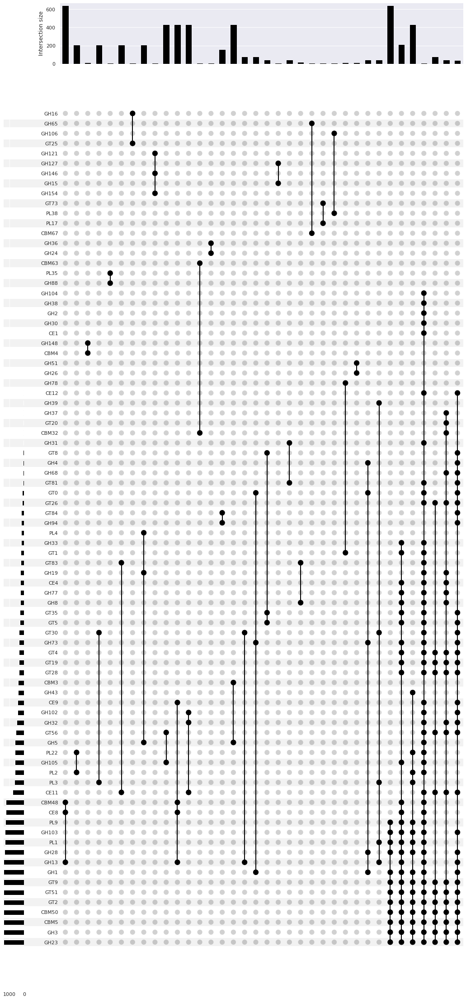

In [85]:
pectobact_upsetplot = build_upsetplot(
    upsetplot_membership,
    file_path='../results/pectobact/cooccurring_families/paper-pecto-cooccurring-families.svg',
    sort_by='input',
)

Calculate the frequency of each group per genus to then build a matrix plot (or proportional area plot).

In [86]:
paper_cooccurring_freqs = []  # [fams, genus/grp, incidence/freq]
num_of_grp = 0

for grp_name in grp_order:
    for fams in grp_order[grp_name]:
        fams = fams.split("+")
        fams.sort()

        for genus in ['Soft tissue targeting', 'Pectobacterium', 'Dickeya', 'Musicola', 'Hard tissue targeting', 'Brenneria', 'Lonsdalea']:
            # {grp num: {'fams': {fams}, 'freqs': {int}}}

            for grp_num in genera_cooccuring_fams[genus]:
                grp_fams = list(genera_cooccuring_fams[genus][grp_num]['fams'])
                grp_fams.sort()

                if grp_fams == fams:
                    # found fams in genus

                    paper_cooccurring_freqs.append(
                        [
                            genera_cooccuring_fams[genus][grp_num]['fams'],
                            genus,
                            list(genera_cooccuring_fams[genus][grp_num]['freqs'])[0],
                        ]
                    )
                    
paper_cooccurring_freqs

[[{'CBM48', 'CE8', 'GH13'}, 'Soft tissue targeting', 635],
 [{'PL2', 'PL22'}, 'Soft tissue targeting', 635],
 [{'PL2', 'PL22'}, 'Dickeya', 205],
 [{'CBM4', 'GH148'}, 'Soft tissue targeting', 8],
 [{'CBM4', 'GH148'}, 'Dickeya', 8],
 [{'GT30', 'PL3'}, 'Dickeya', 205],
 [{'GH88', 'PL35'}, 'Dickeya', 3],
 [{'CE11', 'GT83'}, 'Dickeya', 204],
 [{'GH16', 'GT25'}, 'Dickeya', 1],
 [{'GH19', 'GH5', 'PL4'}, 'Dickeya', 203],
 [{'GH121', 'GH146', 'GH154'}, 'Soft tissue targeting', 1],
 [{'GH121', 'GH146', 'GH154'}, 'Pectobacterium', 1],
 [{'GH105', 'GT56'}, 'Pectobacterium', 425],
 [{'CBM48', 'CE8', 'CE9', 'GH13'}, 'Pectobacterium', 425],
 [{'CE11', 'GH102', 'GH32'}, 'Pectobacterium', 425],
 [{'CBM32', 'CBM63'}, 'Musicola', 2],
 [{'GH24', 'GH36'}, 'Musicola', 2],
 [{'GH94', 'GT84'}, 'Soft tissue targeting', 241],
 [{'GH94', 'GT84'}, 'Pectobacterium', 152],
 [{'GH94', 'GT84'}, 'Dickeya', 89],
 [{'GH94', 'GT84'}, 'Hard tissue targeting', 68],
 [{'GH94', 'GT84'}, 'Lonsdalea', 33],
 [{'CBM3', 'GH5'}, '

In [87]:
# build the dataframe
cooccurring_fams_freq_df = build_upsetplot_matrix(
    paper_cooccurring_freqs,
    'Genus',
    file_path='../results/pectobact/cooccurring_families/paper-cooccurring_fams_freqs.csv',
)
cooccurring_fams_freq_df

,Families,Genus,Incidence
0,"{GH13, CE8, CBM48}",Soft tissue targeting,635
1,"{PL2, PL22}",Soft tissue targeting,635
2,"{PL2, PL22}",Dickeya,205
3,"{CBM4, GH148}",Soft tissue targeting,8
4,"{CBM4, GH148}",Dickeya,8
5,"{GT30, PL3}",Dickeya,205
6,"{PL35, GH88}",Dickeya,3
7,"{GT83, CE11}",Dickeya,204
8,"{GH16, GT25}",Dickeya,1
9,"{PL4, GH19, GH5}",Dickeya,203


<a id="pca"></a>
## 6. Principal Component Analysis (PCA)

Use principal component analysis to identify individual and groups of CAZy families that are strongly associated with divergence between the _Pectobacteriaceae_ genera CAZomes in terms of CAZy family frequencies. 

Use the `cazomevolve` function `perform_pca()` to perform a PCA on a dataframe where each row is a genome, and each column the frequency of a unique CAZy family - the columns in the dataframe must only contain numerical data (i.e. no taxonomic data).

In [88]:
# make output dir for results, will not delete data if dir already exists
make_output_directory(Path('../results/pectobact/pca/'), force=True, nodelete=True)
# reminder of the structure
fam_freq_df.head(2)

Output directory ../results/pectobact/pca exists, nodelete is True. Adding output to output directory.


,Genome,Genus,Species,AA10,AA3,CBM0,CBM13,CBM18,CBM3,CBM32,...,PL11,PL17,PL2,PL22,PL26,PL3,PL35,PL38,PL4,PL9
0,GCA_003725615.1,Dickeya,undicola,0,1,0,0,0,0,0,...,0,0,1,1,0,1,0,0,1,3
1,GCA_000291725.1,Pectobacterium,wasabiae CFBP 3304,0,0,0,0,0,1,1,...,0,0,2,1,1,1,0,0,1,2


In [89]:
num_of_components = len(fam_freq_filtered_df_ggs.columns)
pectobact_pca, X_scaled = perform_pca(fam_freq_filtered_df_ggs, num_of_components)

In [90]:
pectobact_pca

PCA(n_components=117)

**Explained cumulative variance:**

Explore the amount of variance in the dataset that is captured by the dimensional reduction performed by the PCA.

Number of features needed to explain 0.95 fraction of total variance is 59. 


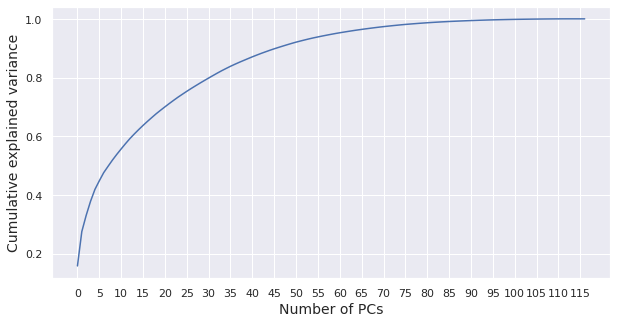

In [91]:
cumExpVar = plot_explained_variance(
    pectobact_pca,
    num_of_components,
    file_path="../results/pectobact/pca/pca_explained_variance.png",
)

In [92]:
print(f"{pectobact_pca.explained_variance_ratio_.sum() * 100}% of the variance in the data set was catpured by the PCA")

100.00000000000003% of the variance in the data set was catpured by the PCA


**Variance captured per PC:**

Explore the variance in the data that is captured by each PC.

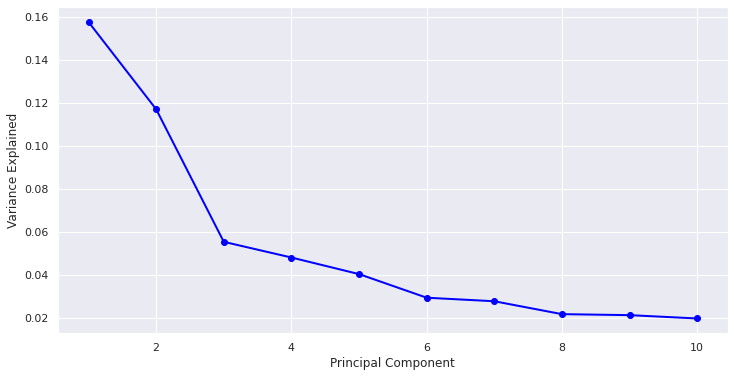

Explained variance for 1PC: 0.15781670776311277
Explained variance for 2PC: 0.1171453174519268
Explained variance for 3PC: 0.055353539233033204
Explained variance for 4PC: 0.04804711615760429
Explained variance for 5PC: 0.04031600741870656
Explained variance for 6PC: 0.029313990173380065
Explained variance for 7PC: 0.0276638346613621
Explained variance for 8PC: 0.021653599705441406
Explained variance for 9PC: 0.021188563199185613
Explained variance for 10PC: 0.019638464318788088


In [93]:
plot_scree(pectobact_pca, nComp=10, file_path="../results/pectobact/pca/pectobact_pca_pca_scree.png")

PC1 (15%) and PC2 (11%) capture a signficantly greater degree of the varaince in the data set than all other PCs.  
PC3 (6%) and PC4 (5%) capture comparable degrees of the variance

### Scatter and loadings plots

To explore the variance captured by each PC, plot different combinations of PCs onto a scatter plot where each axis represents a different PC and each point on the plot is a genome in the data set, using the `plot_pca()` function.

`plot_pca()` takes 6 positional argumets:
1. PCA object from `peform_pca()`
2. Scaling object (X_scaled) from `perform_pca()`
3. The dataframe of CAZy family frequencies, if you want to colour code the genomes by a specific grouping (i.e. by Genus), an additional column containing the grouping information needs to be added to the dataframe (e.g. listing the genus per genome)
4. The number of the first PC to be plotted, e.g. 1 for PC1 - int
5. The number of the second PC to be plotted, e.g. 2 for PC2 - int
6. The method to colour code the genomes by (e.g. 'Genus') - needs to match the name of the column containing the data in the dataframe of CAZy family frequencies

Owing to the majoirty of the variance captured by the PCA being captured by PCs 1-4, all possible combinations of these PCs were explored.

### PC1 vs PC2

Not applying hue order
Applying style
Not applying style order


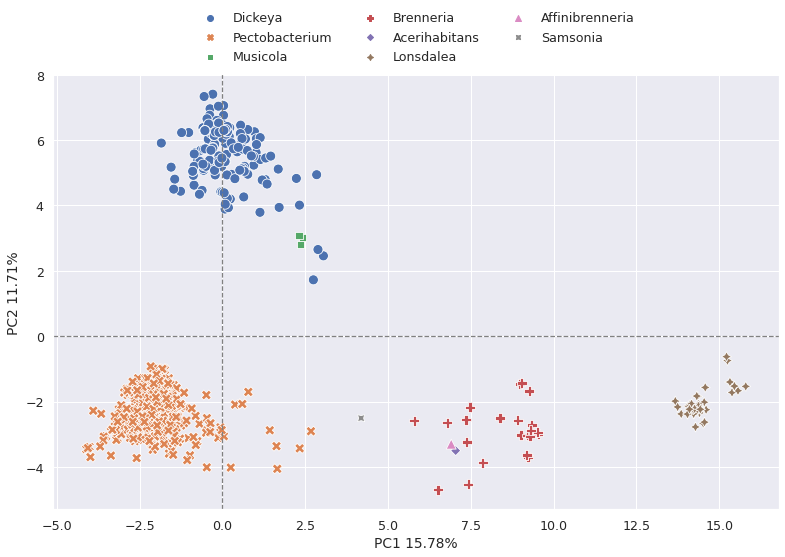

In [94]:
fam_freq_filtered_df_ggs['Genus'] = list(fam_freq_filtered_df['Genus'])  # add column to use for colour scheme

pc1_pc2_scatter_plt = plot_pca(
    pectobact_pca,
    X_scaled,
    fam_freq_filtered_df_ggs,
    1,
    2,
    'Genus',
    style='Genus',
    figsize=(13,8),
    file_path='../results/pectobact/pca/pca_pc1_vs_pc2.png',
)

Regenerate the plot above but label the _Dickeya_ genomes that are clustered with _Musicola_, and the _Pectobacterium_ genomes that are on the PC1 +ve axis.

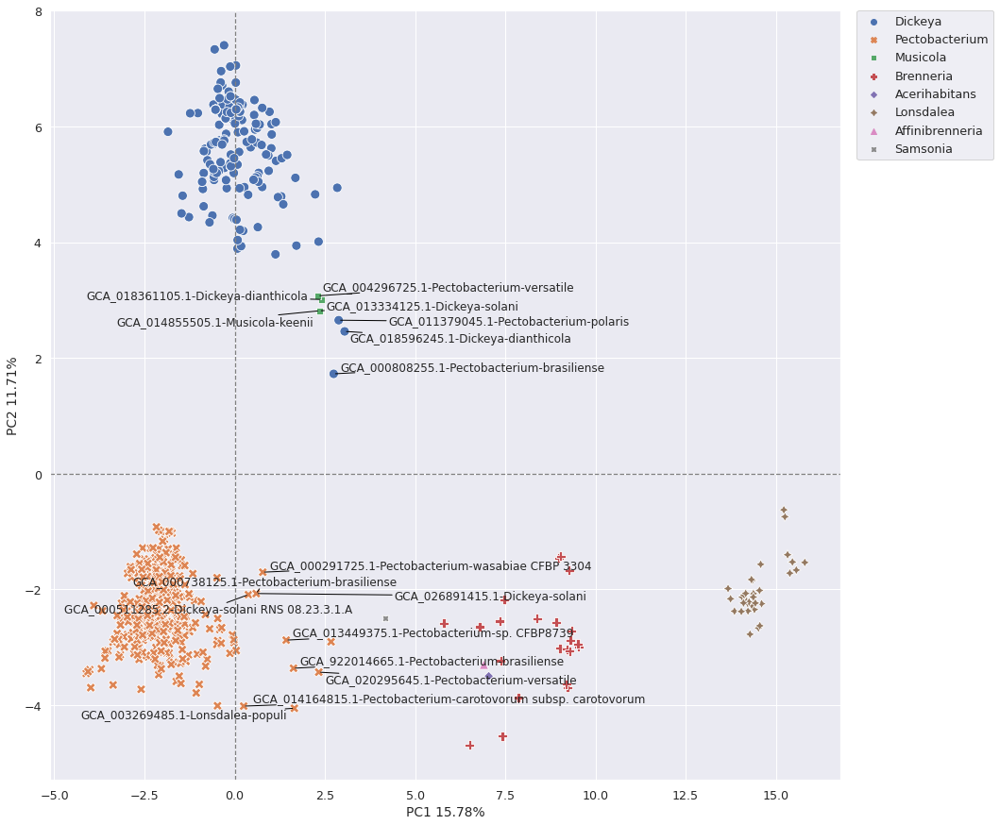

In [95]:
X_pca = pectobact_pca.transform(X_scaled)
plt.figure(figsize=(15,15))
sns.set(font_scale=1.15)
g = sns.scatterplot(
    x=X_pca[:,0],
    y=X_pca[:,1],
    data=fam_freq_filtered_df_ggs,
    hue='Genus',
    style='Genus',
    s=100,
    markers=True,
)

g.axhline(0, linestyle='--', color='grey', linewidth=1.25);
g.axvline(0, linestyle='--', color='grey', linewidth=1.25);

plt.ylabel(f"PC2 {100 * pectobact_pca.explained_variance_ratio_[1]:.2f}%");
plt.xlabel(f"PC1 {100 * pectobact_pca.explained_variance_ratio_[0]:.2f}%");
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0);

genome_lbls = ["-".join(_) for _ in fam_freq_df_ggs.index]
x_vals = X_pca[:,0]
y_vals = X_pca[:,1]

texts = [
    plt.text(
        xval,
        yval,
        lbl,
        ha='center',
        va='center',
        fontsize=12,
    ) for (xval, yval, lbl) in zip(
        x_vals, y_vals, genome_lbls
    ) if ((xval > 2) and (yval < 3.5) and (yval > 0) and (xval < 4)) or ((xval > 0.1) and (xval < 2.5) and (yval < 0))
]
adjustText.adjust_text(texts, arrowprops=dict(arrowstyle='-', color='black'));

plt.savefig('../results/pectobact/pca/pca_pc1_vs_pc2_musicola_annotated.png', bbox_inches='tight', format='png')

Build the loadings plot for the scatter plot.

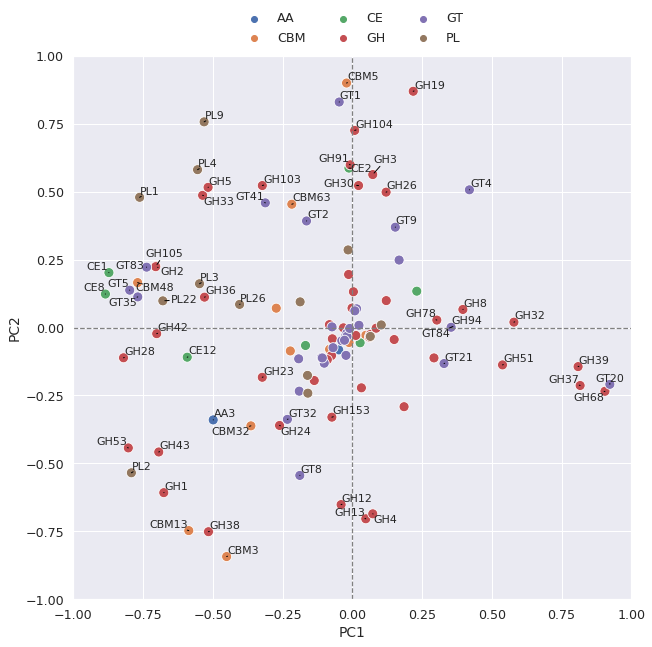

In [96]:
plot_loadings(
    pectobact_pca,
    fam_freq_filtered_df_ggs,
    1,
    2,
    threshold=0.3,
    fig_size=(10,10),
    file_path="../results/pectobact/pca/pc1_pc2_loadings_plot",
    font_size=11,
)

### PC1 vs PC3

Not applying hue order
Applying style
Not applying style order


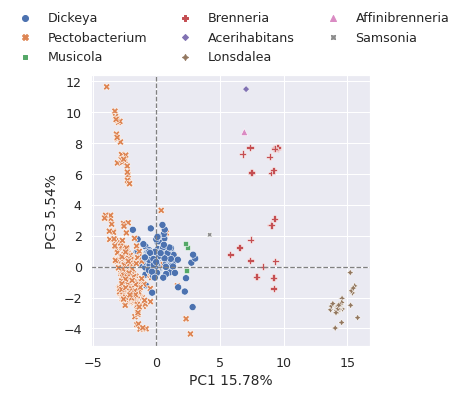

In [97]:
pc1_pc3_scatter_plt = plot_pca(
    pectobact_pca,
    X_scaled,
    fam_freq_filtered_df_ggs,
    1,
    3,
    'Genus',
    style='Genus',
    figsize=(5,5),
    marker_size=50,
)

### PC1 vs PC4

Not applying hue order
Applying style
Not applying style order


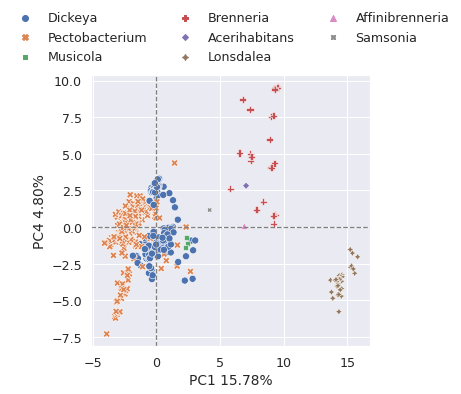

In [98]:
pc1_pc4_scatter_plt = plot_pca(
    pectobact_pca,
    X_scaled,
    fam_freq_filtered_df_ggs,
    1,
    4,
    'Genus',
    style='Genus',
    figsize=(5,5),
    marker_size=50,
)

### PC2, PC3 and PC4

Not applying hue order
Applying style
Not applying style order


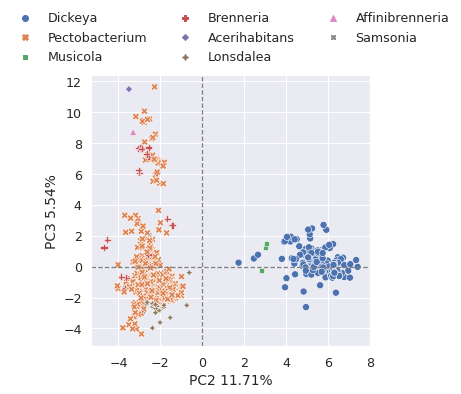

In [99]:
pc2_pc3_scatter_plt = plot_pca(
    pectobact_pca,
    X_scaled,
    fam_freq_filtered_df_ggs,
    2,
    3,
    'Genus',
    style='Genus',
    figsize=(5,5),
    marker_size=50,
)

Not applying hue order
Applying style
Not applying style order


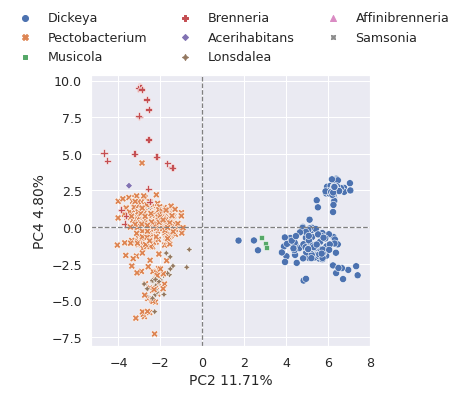

In [100]:
pc2_pc4_scatter_plt = plot_pca(
    pectobact_pca,
    X_scaled,
    fam_freq_filtered_df_ggs,
    2,
    4,
    'Genus',
    style='Genus',
    figsize=(5,5),
    marker_size=50,
)

Not applying hue order
Applying style
Not applying style order


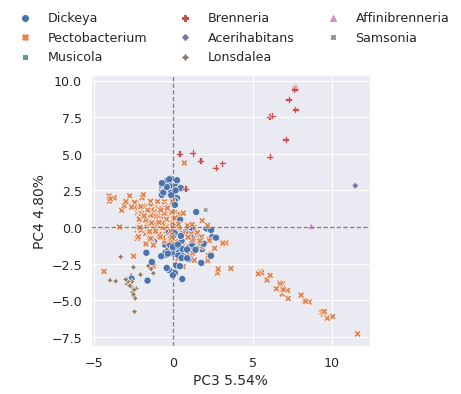

In [101]:
pc3_pc4_scatter_plt = plot_pca(
    pectobact_pca,
    X_scaled,
    fam_freq_filtered_df_ggs,
    3,
    4,
    'Genus',
    style='Genus',
    figsize=(5,5),
    marker_size=50,
)

PC1 separates out the genomes in a manner that correlates with their genus classification: _Pectobacterium_ genomes are locataed in the negative PC1 axis, and _Dickeya_ genomes are located in the positive PC1 axis.

PCs 2-4 do not correlate with the genus classification.